<a href="https://colab.research.google.com/github/dmc-mcc/DSI/blob/main/pw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#%% Import Libraries and data
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from scipy import stats
from google.colab import files
import matplotlib.cm as cm
import warnings
warnings.filterwarnings("ignore")

In [ ]:
masterdata=pd.read_csv("masterdata.csv")
masterdata.head()

,Date,dow_Open,dow_High,dow_Low,dow_Close,dow_AdjClose,dow_Volume,dow_return,nasdaq_Open,nasdaq_High,...,wheat_Open,wheat_High,wheat_Low,wheat_Close,wheat_AdjClose,wheat_Volume,wheat_return,month,quarter,year
0,2018-01-02,24850.449219,24941.919922,24825.550781,24922.679688,24922.679688,456790000.0,0.397478,7017.069824,7069.149902,...,435.25,437.00,432.00,436.00,436.00,70970.0,0.576701,1.0,1.0,2018.0
1,2018-01-03,24850.449219,24941.919922,24825.550781,24922.679688,24922.679688,456790000.0,0.397478,7017.069824,7069.149902,...,435.25,437.00,432.00,436.00,436.00,70970.0,0.576701,1.0,1.0,2018.0
2,2018-01-04,24964.859375,25105.960938,24963.269531,25075.130859,25075.130859,403280000.0,0.611697,7089.500000,7098.049805,...,435.75,436.00,431.00,434.00,434.00,58728.0,-0.458716,1.0,1.0,2018.0
3,2018-01-05,25114.919922,25299.789062,25112.009766,25295.869141,25295.869141,358020000.0,0.880308,7105.740234,7137.040039,...,433.00,433.75,427.50,430.75,430.75,62551.0,-0.748848,1.0,1.0,2018.0
4,2018-01-08,25308.400391,25311.990234,25235.410156,25283.000000,25283.000000,341390000.0,-0.050874,7135.379883,7161.350098,...,430.25,432.25,425.75,427.75,427.75,71822.0,-0.696460,1.0,1.0,2018.0


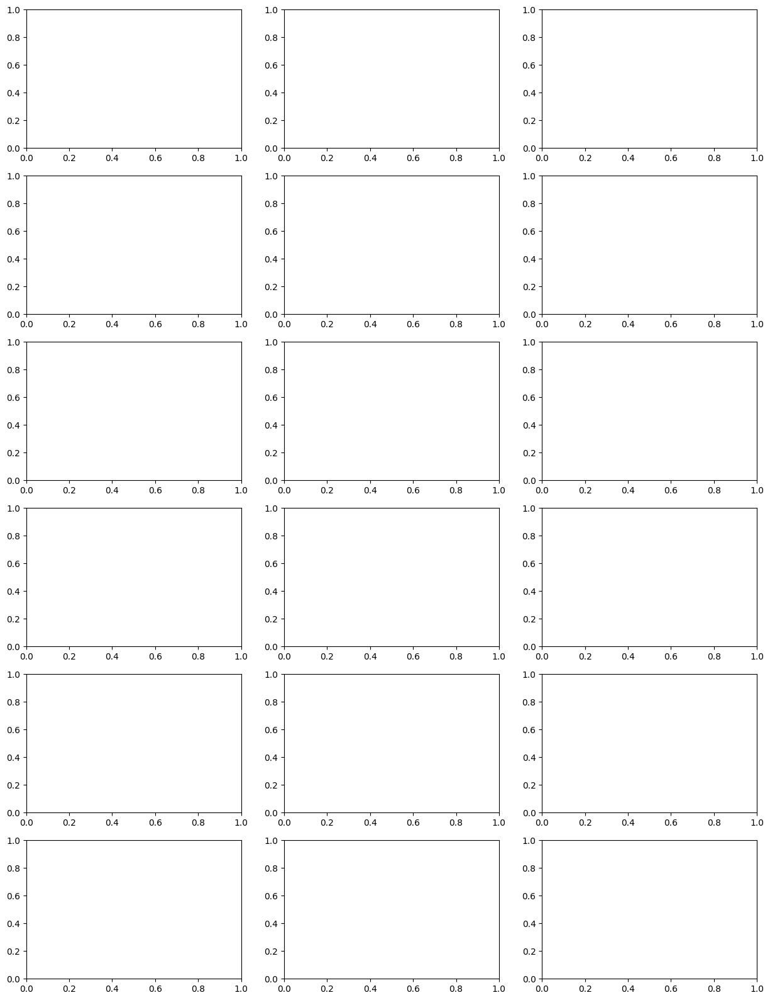

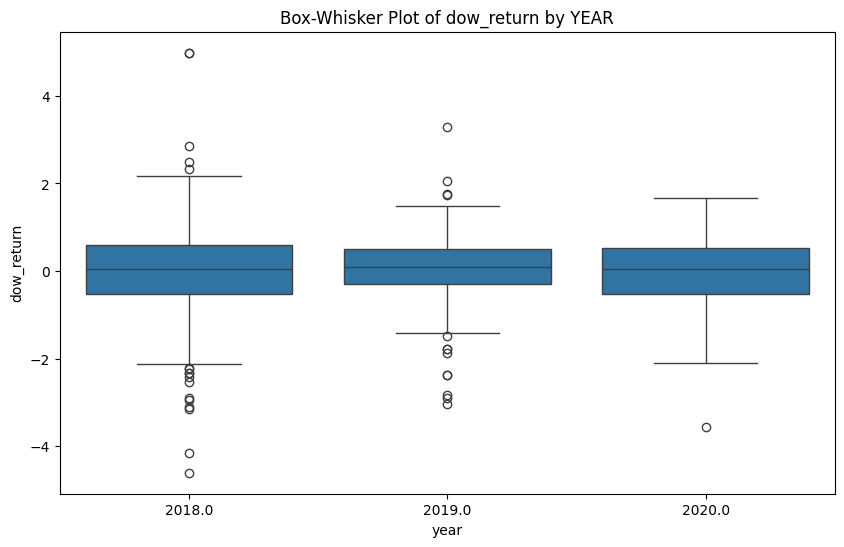

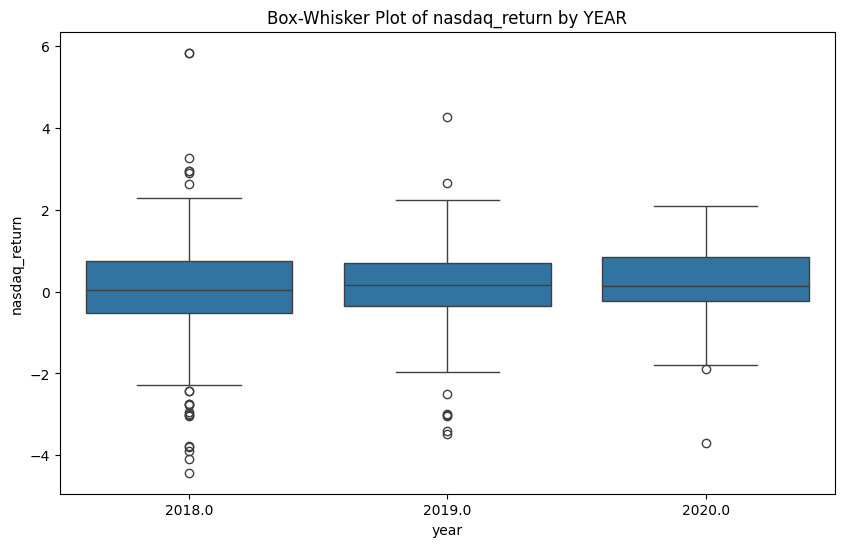

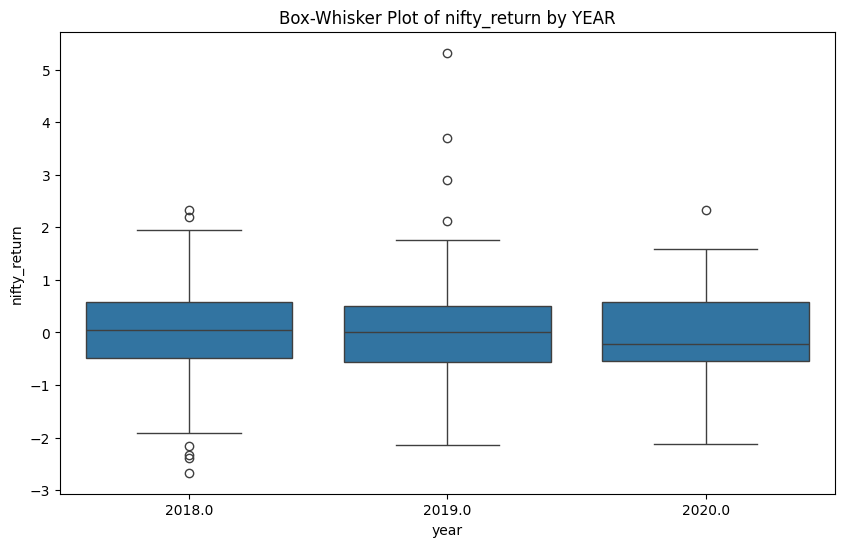

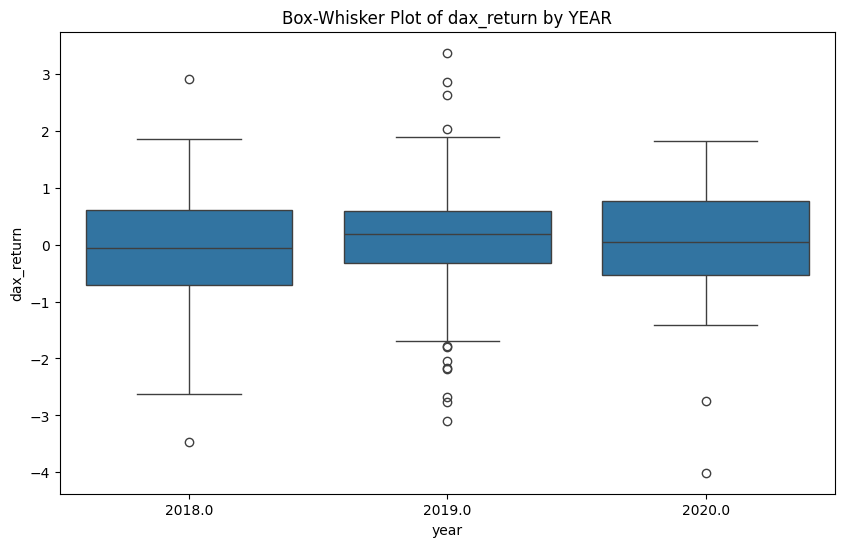

...

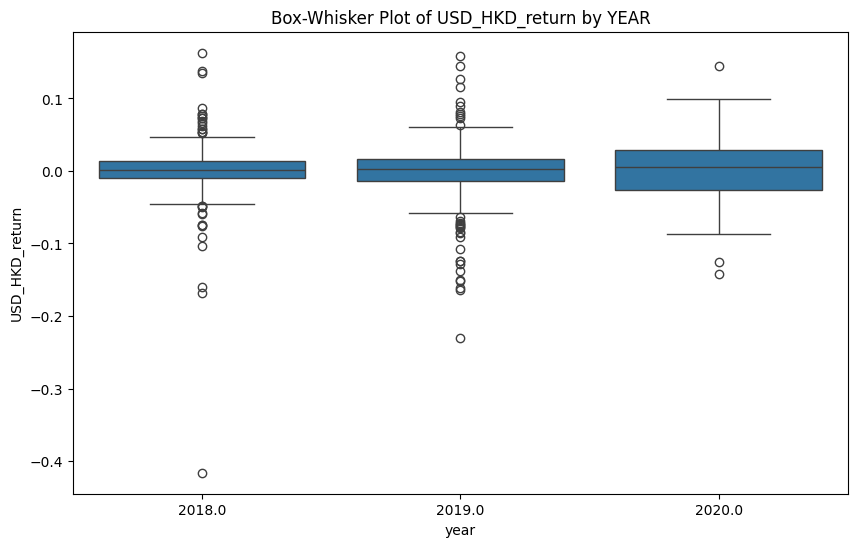

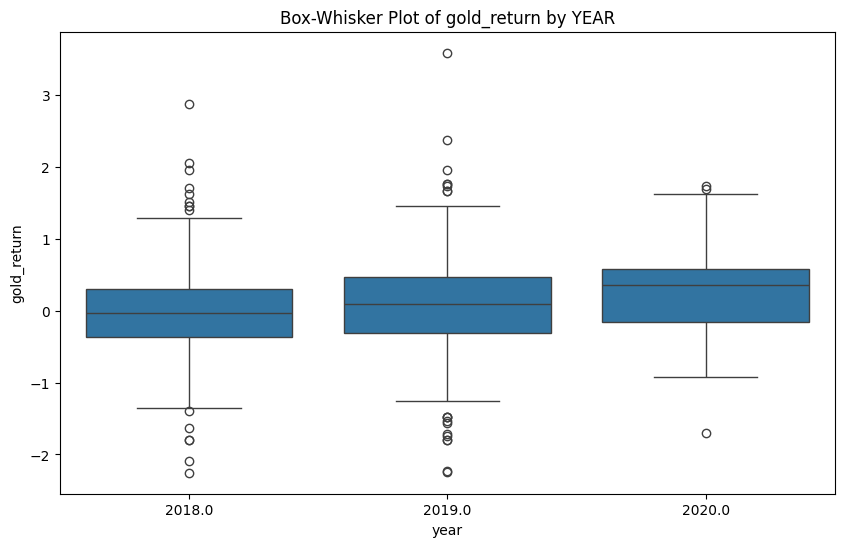

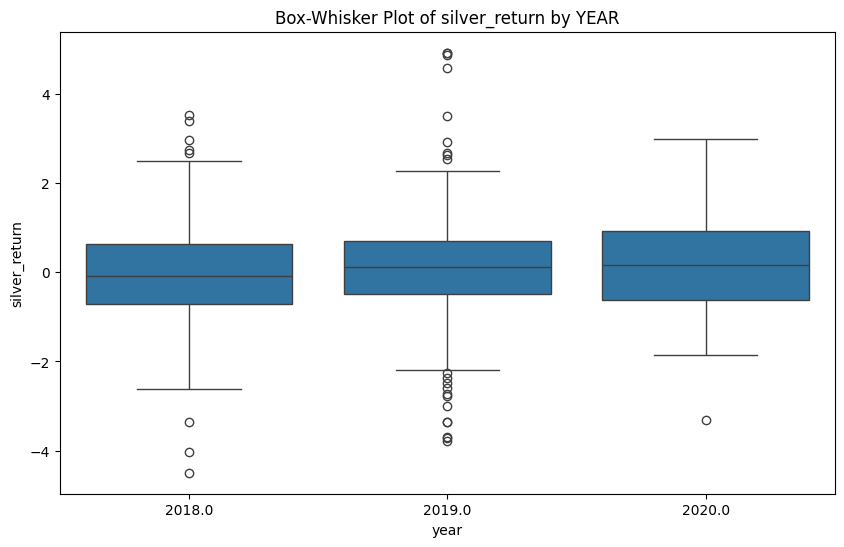

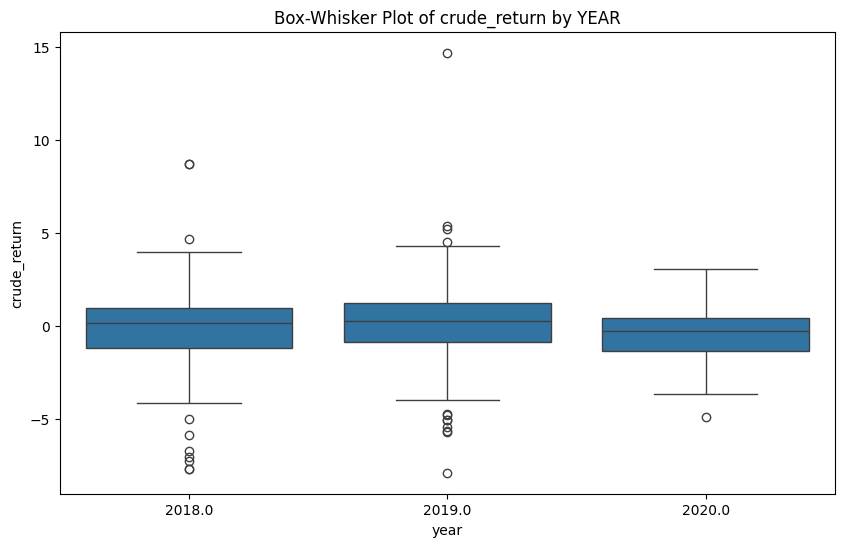

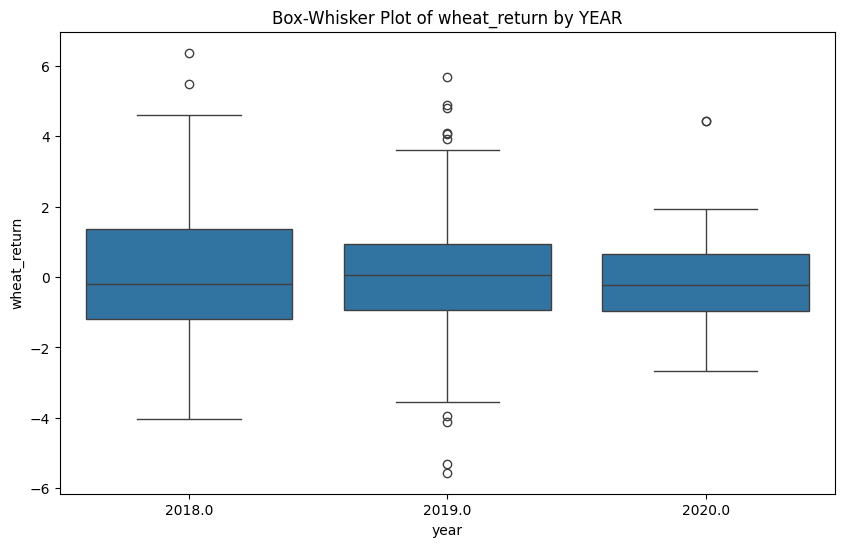

In [ ]:
#%% Part-1: Global Indices 5 years Performance Analytics, for each index:
"""
Global Indices 5 years Performance Analytics, for each index:
a) Box-Whisker Plot of daily returns by “YEAR”
b) Table of daily returns by “YEAR”- (n, mean and std. deviation)
c) Bar Plot of median daily return by “YEAR”
d) Heat Map by “YEAR” and “QUARTER” showing median/mean returns

"""
#%% Part-1-a) Box-Whisker Plot of daily returns by “YEAR”
# Create subplots
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()
for index in ['dow_return', 'nasdaq_return', 'nifty_return', 'dax_return', 'hangseng_return', 'nikkei_return','vix_return','EUR_USD_return','GBP_USD_return','EUR_GBP_return','USD_JPY_return','USD_INR_return','USD_HKD_return','gold_return','silver_return','crude_return','wheat_return']:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='year', y=index, data=masterdata)
    plt.title(f'Box-Whisker Plot of {index} by YEAR')
    plt.show()

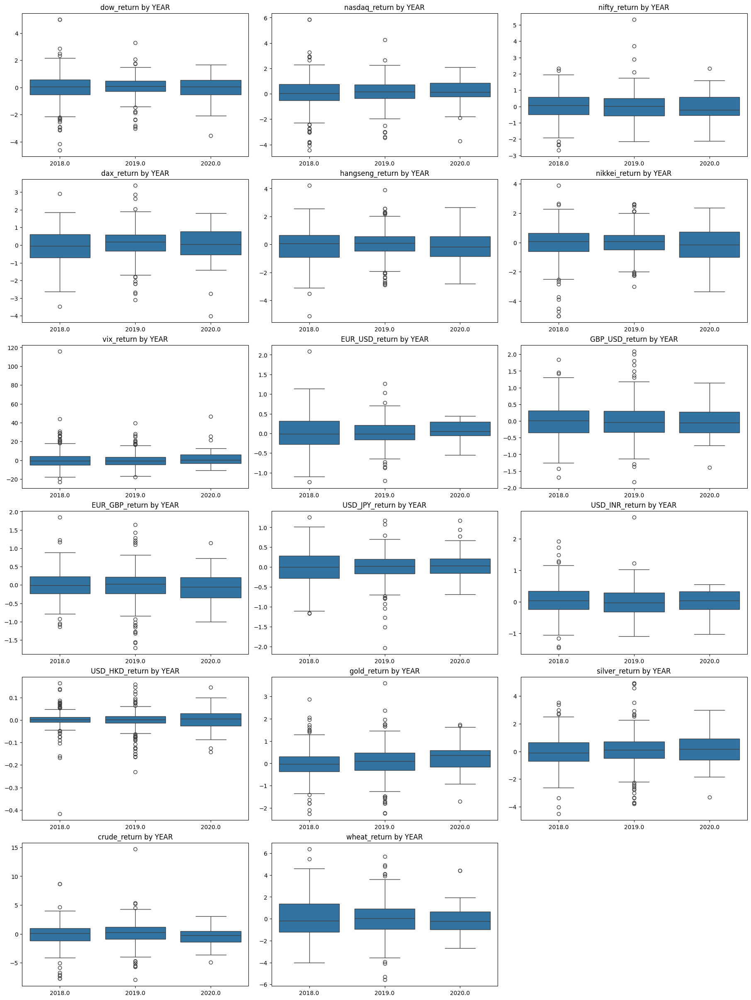

In [ ]:
#Creating subplots for PPP
#%% Part-1-a) Box-Whisker Plot of daily returns by “YEAR”
# List of indices
indices = ['dow_return', 'nasdaq_return', 'nifty_return', 'dax_return', 'hangseng_return', 'nikkei_return',
           'vix_return', 'EUR_USD_return', 'GBP_USD_return', 'EUR_GBP_return', 'USD_JPY_return', 'USD_INR_return',
           'USD_HKD_return', 'gold_return', 'silver_return', 'crude_return', 'wheat_return']

# Create subplots grid
n_rows = 6
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 24), constrained_layout=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each index on a subplot
for i, index in enumerate(indices):
    sns.boxplot(x='year', y=index, data=masterdata, ax=axes[i])
    axes[i].set_title(f'{index} by YEAR')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

# Remove empty subplots (if any)
for j in range(len(indices), len(axes)):
    fig.delaxes(axes[j])

# Show the plot
plt.show()

# Analysis of just stock indices
## 1. Dow Jones Industrial Average (Dow)
    # The returns in 2020 show a much wider range than other years, indicating
    # higher volatility during that period. The median return is close to zero
    # for most years, except for 2020, which has a slightly negative median.
    # The year 2020 also shows some extreme negative returns, as evident from
    # the outliers below the lower whisker.
## 2. NASDAQ
    # Like the Dow, NASDAQ shows higher volatility in 2020, with a wider
    # interquartile range (IQR) and outliers on both ends. The median returns
    # are relatively stable around zero for all years except 2020, which is
    # slightly positive.
## 3. NIFTY 50 (Nifty)
    # The IQR for Nifty is consistent across the years, with no year showing
    # exceptionally high volatility. The median is close to zero each year,
    # with no significant outliers suggesting extreme returns.
## 4. DAX
    # DAX also reflects higher volatility in 2020, but not as pronounced as in
    # the Dow or NASDAQ plots. The median is close to zero for all years,
    # indicating that positive and negative returns are balanced.
## 5. Hang Seng Index (Hangseng)
    # Hangseng's box plots have medians around zero, similar to other indices.
    # The plot for 2020 is wider than other years, though less pronounced than
    # the Dow or NASDAQ, indicating increased volatility.
## 6. Nikkei 225 (Nikkei)
    # The Nikkei shows a consistent IQR across the years. The median is around
    # zero for all years, indicating a balance in positive and negative daily
    # returns.
## Overall Observations:
    # The year 2020 stands out in several plots as a year of higher volatility,
    # likely due to the COVID-19 pandemic's impact on financial markets.
    # Most indices have medians close to zero, suggesting that on most days,
    # the returns are evenly distributed around the zero line. Outliers are
    # present in each plot, indicating days with extreme returns. These are
    # more common in the plots for 2020, highlighting the unpredictable nature
    # of markets during that year.

#Trend analysis

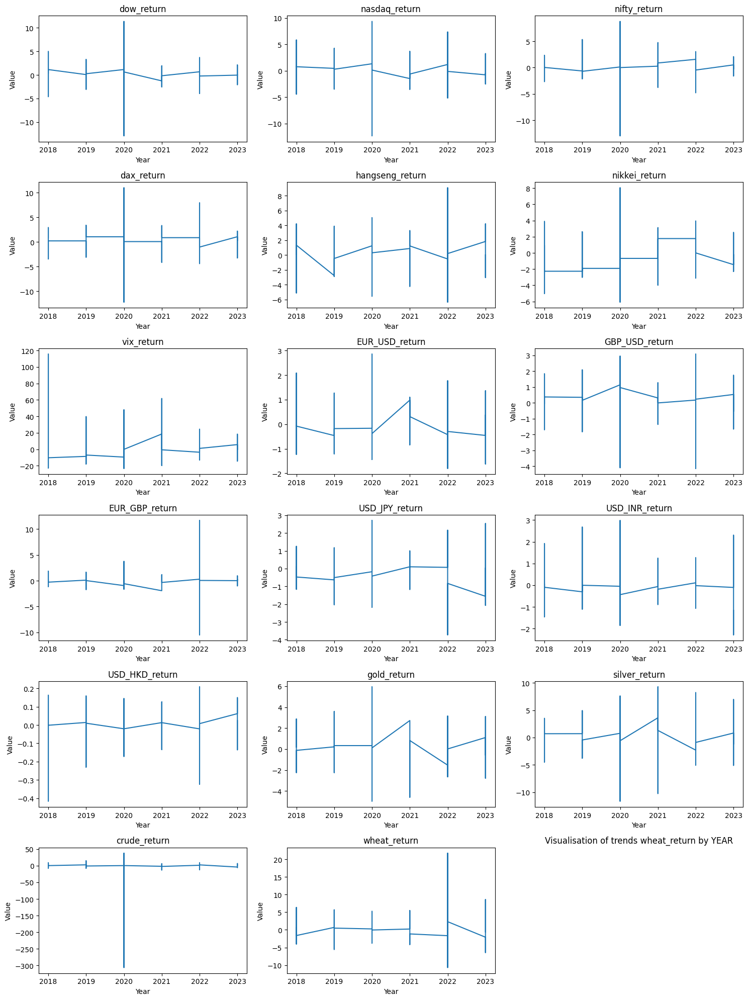

In [ ]:
# Define the columns for which you want to plot the stacked bar plot
columns_to_plot = ['dow_return', 'nasdaq_return', 'nifty_return', 'dax_return',
                   'hangseng_return', 'nikkei_return', 'vix_return', 'EUR_USD_return',
                   'GBP_USD_return', 'EUR_GBP_return', 'USD_JPY_return', 'USD_INR_return',
                   'USD_HKD_return', 'gold_return', 'silver_return', 'crude_return',
                   'wheat_return']


# Create subplots
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over each variable and plot it
for i, column in enumerate(columns_to_plot):
    ax = axes[i]
    ax.plot(masterdata['year'], masterdata[column])
    ax.set_title(column)
    ax.set_xlabel('Year')
    ax.set_ylabel('Value')

# Hide empty subplots
for i in range(len(columns_to_plot), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.title(f'Visualisation of trends {index} by YEAR')
plt.show()


In [ ]:
#%% Part-1-b) Table of daily returns by “YEAR”- (n, mean and std. deviation)

return_columns = [col for col in masterdata.columns if col.endswith('_return')]

# Filter data for all years and select only return columns
indices_returns = masterdata[return_columns]

for indices in indices_returns:
    print(indices)
    print(masterdata.groupby('year')[indices].agg(['count','median','mean','std']))

dow_return
        count    median      mean       std
year                                       
2018.0    260  0.039668 -0.015841  1.164501
2019.0    261  0.083396  0.066852  0.780808
2020.0    262  0.147011  0.057284  2.289651
2021.0    261  0.072854  0.059863  0.797978
2022.0    260 -0.114768 -0.035444  1.242398
2023.0    260  0.052347  0.036562  0.724238
nasdaq_return
        count    median      mean       std
year                                       
2018.0    260  0.032717  0.001518  1.355731
2019.0    261  0.154615  0.111459  0.982761
2020.0    262  0.418823  0.168597  2.218909
2021.0    261  0.109321  0.083158  1.139177
2022.0    260 -0.188347 -0.145622  1.996381
2023.0    260  0.132589  0.133734  1.088665
nifty_return
        count    median      mean       std
year                                       
2018.0    260  0.054651  0.017424  0.812547
2019.0    261  0.016047  0.025818  0.893253
2020.0    262  0.226899  0.074687  2.047751
2021.0    261  0.121171  0.084263  1.0

# Analysis of just stock indices
## Dow Jones Industrial Average (Dow)
    # - Highest Volatility: 2020 with the highest standard deviation.
    # - Negative Mean Returns: Notably in 2018 and 2022.
    # - Positive Shift in Median: A significant positive median in 2020 compared
    #   to other years suggests a skewed distribution with more very positive days.
    # - Consistent Positive Median: Despite some negative mean returns, the
    #   median is positive in most years.

## NASDAQ
    # - Increased Volatility: Like the Dow, 2020 shows increased volatility.
    # - Mean vs. Median: The mean is significantly higher than the median in 2020,
    #   indicating a few very high-return days skewing the average.
    # - Negative Mean Returns: 2022 shows a substantial negative mean, indicating a
    #   tough year for the NASDAQ.

## NIFTY 50 (Nifty)
    # - Highest Volatility: Also in 2020, with a very high median return, suggesting
    #   a good year despite increased volatility.
    # - Steady Growth: The median and mean returns are consistently positive except
    #   for a small dip in 2022 possibly as a result of Russia's invasion of
    #   Ukraine.

## DAX
    # - Variable Returns: The mean returns swing from negative to positive, with
    #   the highest volatility in 2020.
    # - Steady Median Growth: Despite the mean variations, the median remains
    #   consistently positive after 2018.

## Hang Seng Index (Hangseng)
    # - Negative Mean Returns: Particularly in 2018 and 2021, with high volatility
    #   throughout the period.
    # - Significant Dips: The median dips to a substantial negative in 2022,
    #   suggesting many days with poor returns.

## Nikkei 225 (Nikkei)
    # - Positive Trend in Recent Years: 2023 shows a notable increase in both mean
    #   and median returns.
    # - Mixed Performance: Some years have negative mean returns, but the median
    #   often stays positive, suggesting that losses on the worst days are pulling
    #   the average down.

## General Observations
    # - Year 2020: All indices experienced increased volatility, possibly due to
    #   the COVID-19 pandemic's impact on global markets.
    # - Mean vs. Median: Where the mean is lower than the median, it suggests that
    #   losses on the worst days are pulling the average down, whereas a mean higher
    #   than the median suggests a few days with very high returns are pushing the
    #   average up.
    # - Trends: After a challenging 2020, most indices appear to have recovered
    #   somewhat, although 2022 was difficult for NASDAQ and Hang Seng, possibly as
    #   a result of Russia's invasion of Ukraine.

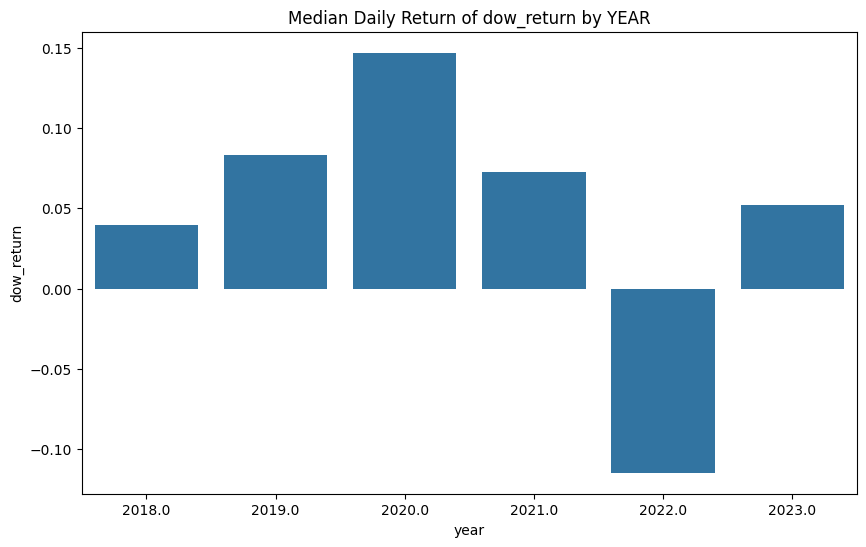

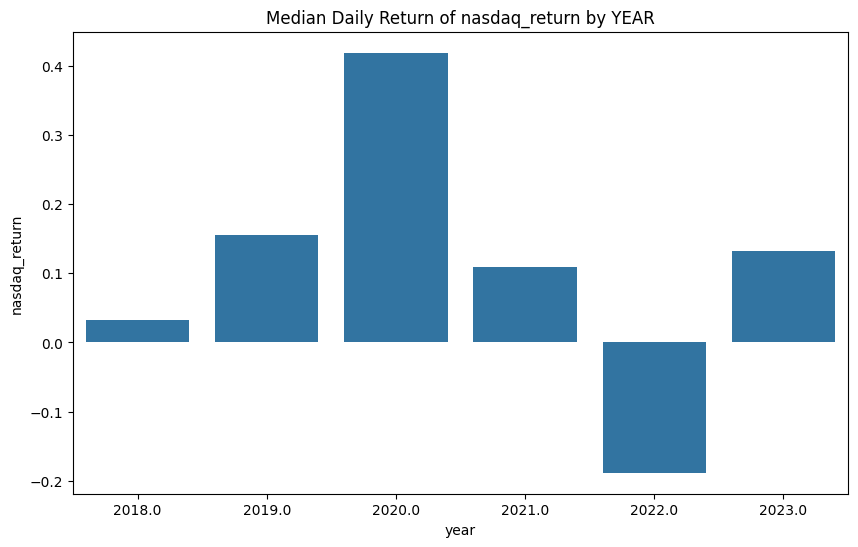

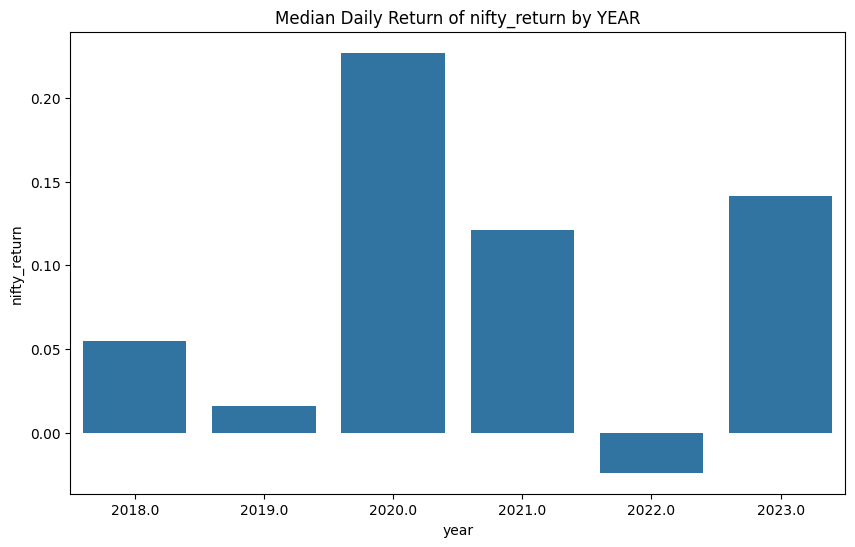

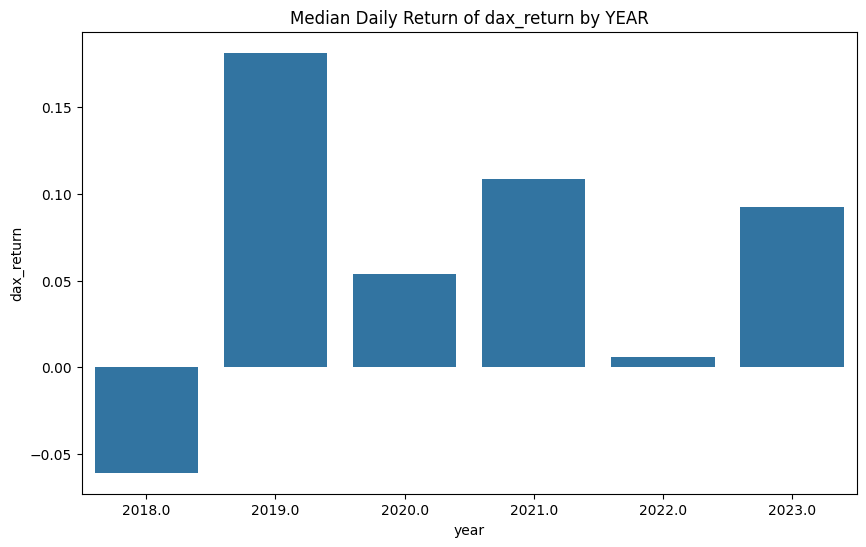

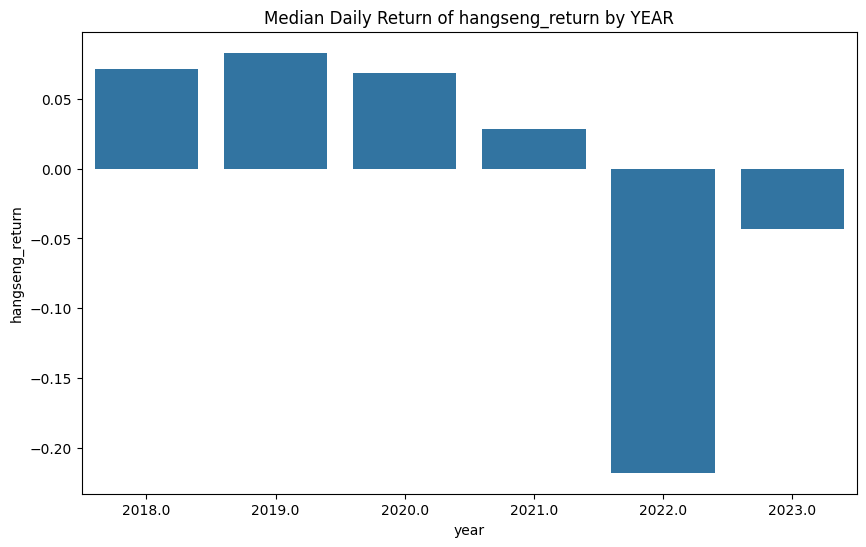

...

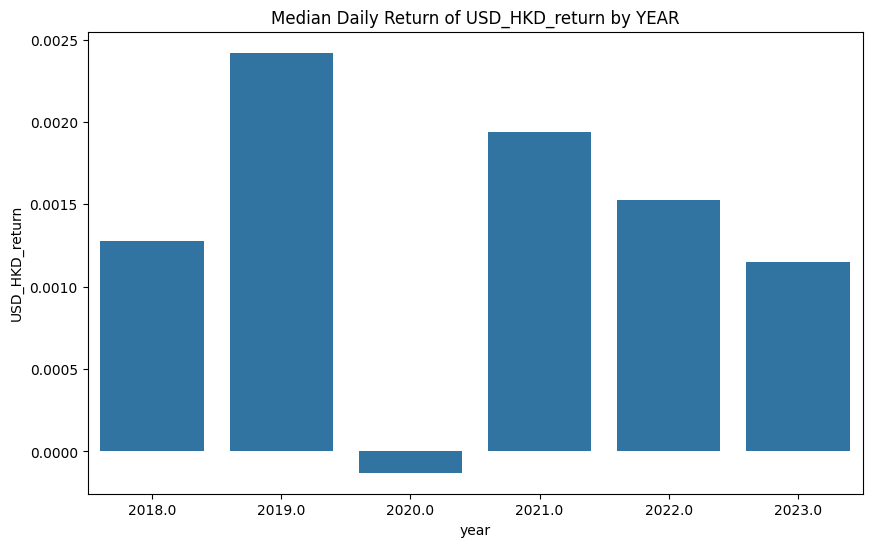

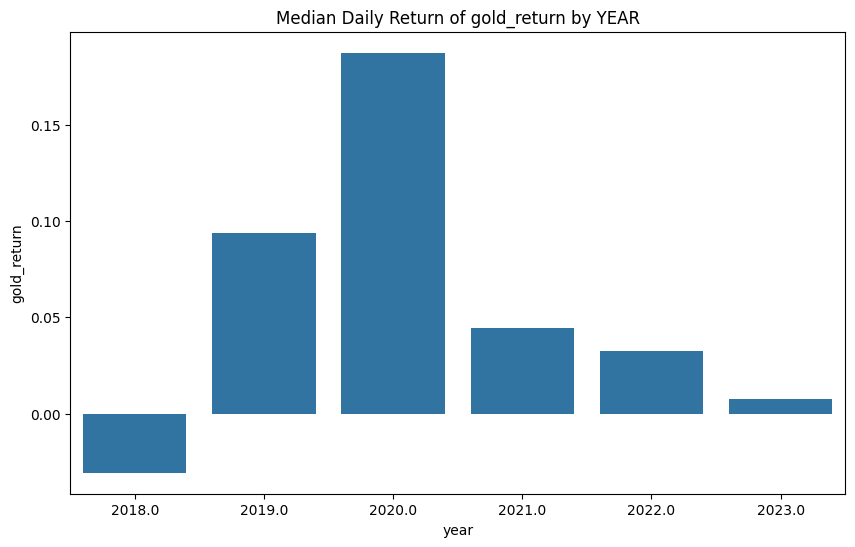

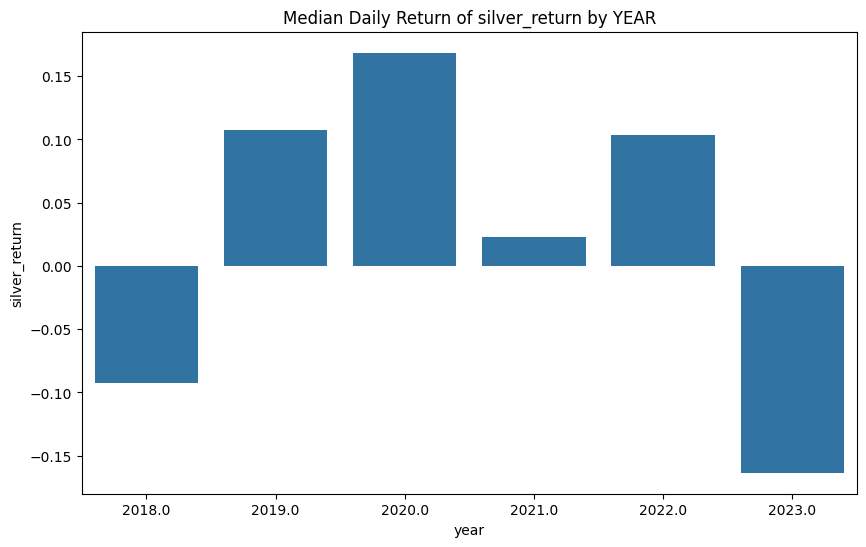

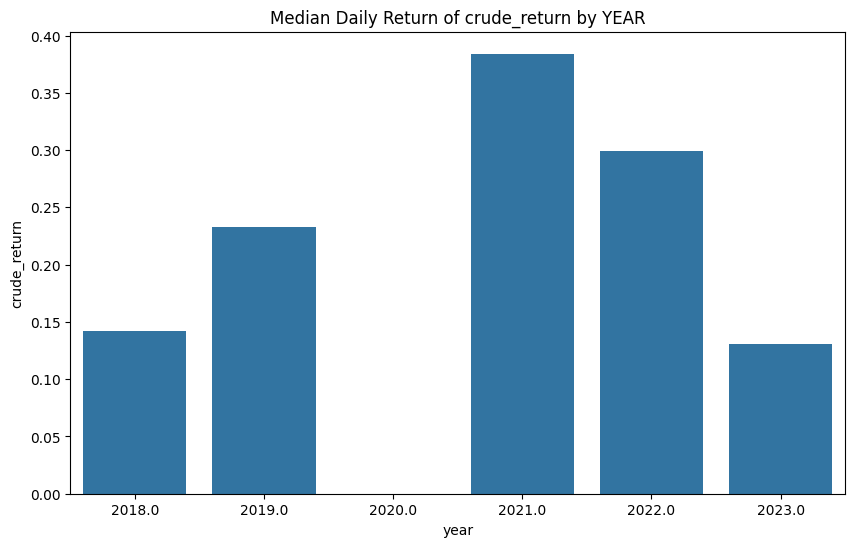

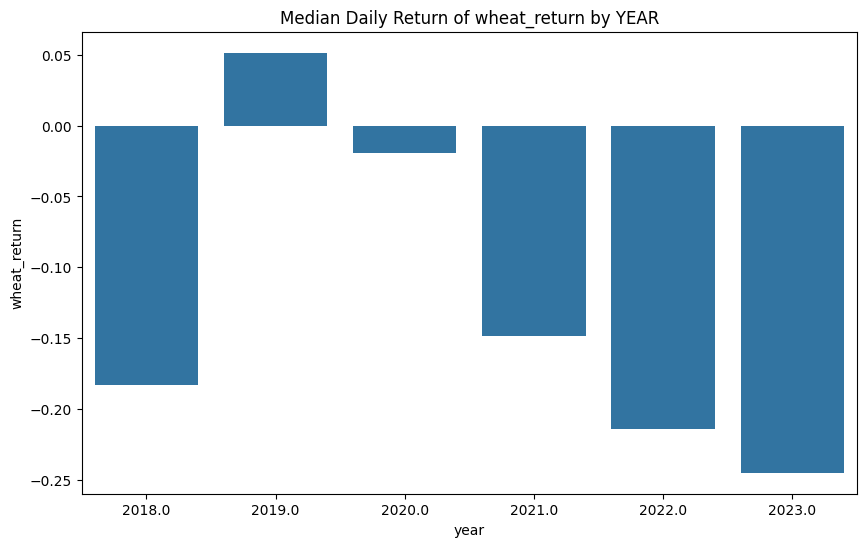

In [ ]:
#%% Part-1-c) Bar Plot of median daily returns by “YEAR”

return_columns = [col for col in masterdata.columns if col.endswith('_return')]

# Filter data for all years and select only return columns
indices_returns = masterdata[return_columns]

for indices in indices_returns:
    median_returns = masterdata.groupby('year')[indices].median().reset_index()
    plt.figure(figsize=(10, 6))
    sns.barplot(x='year', y=indices, data=median_returns)
    plt.title(f'Median Daily Return of {indices} by YEAR')
    plt.show()

# Analysis of just stock indices
## Dow Jones Industrial Average (Dow)
    # - The median daily return was lowest in 2022, suggesting a more typical day
    #   in that year resulted in a loss.
    # - The highest median return occurred in 2020, indicating that despite the
    #   volatility and potential negative outliers (as discussed earlier), the
    #   central tendency was positive.
    # - Over the period from 2018 to 2023, there does not seem to be a consistent
    #   trend in median returns.

## NASDAQ
    # - The highest median daily return was in 2020, potentially reflecting the
    #   strong performance of tech stocks during the pandemic.
    # - In contrast to the Dow, the NASDAQ had the second-lowest median return in
    #   2021, not 2022, indicating a different performance pattern.
    # - 2022 again had the lowest median return, indicative of a tougher year for
    #   investors in this index.

## NIFTY 50 (Nifty)
    # - Nifty displayed its highest median daily return in 2020, similar to the Dow
    #   and NASDAQ, but unlike the latter two, it also showed a significant median
    #   return in 2023.
    # - The lowest median return for Nifty was in 2022, aligning with the trend seen
    #   in the Dow and NASDAQ.

## DAX
    # - The highest median daily return for the DAX was in 2019, which deviates from
    #   the pattern of the other indices where 2020 was often the peak.
    # - 2018 had the lowest median daily return, with 2023 also showing a decline
    #   compared to 2021 and 2022.

## Hang Seng Index (Hangseng)
    # - Hangseng's median daily return was the lowest in 2022, and similar to Nifty,
    #   it showed an increase in 2023.
    # - The median return fluctuated over the years without a clear upward or
    #   downward trend.

## Nikkei 225 (Nikkei)
    # - Nikkei’s median daily returns were relatively stable with gradual
    #   fluctuations until 2022 when it dipped, followed by a significant increase
    #   in 2023.
    # - The trend for Nikkei diverges from others in 2020 where it did not have its
    #   peak median return, which is more consistent with its behavior in the other
    #   tables.

## Overall Observations
    # - Peak in 2020: For most indices, except for DAX and Nikkei, the peak median
    #   daily return occurred in 2020, suggesting that despite the pandemic, more
    #   than half the days had positive returns.
    # - Dip in 2022: Except for DAX, which had its lowest median return in 2018,
    #   all indices show their lowest median daily returns in 2022, indicating a
    #   challenging year across global markets, possibly as a result of Russia's
    #   invasion of Ukraine.
    # - Recovery in 2023: There is a general uptick in median daily returns for
    #   Nifty and Hangseng in 2023, suggesting some recovery.

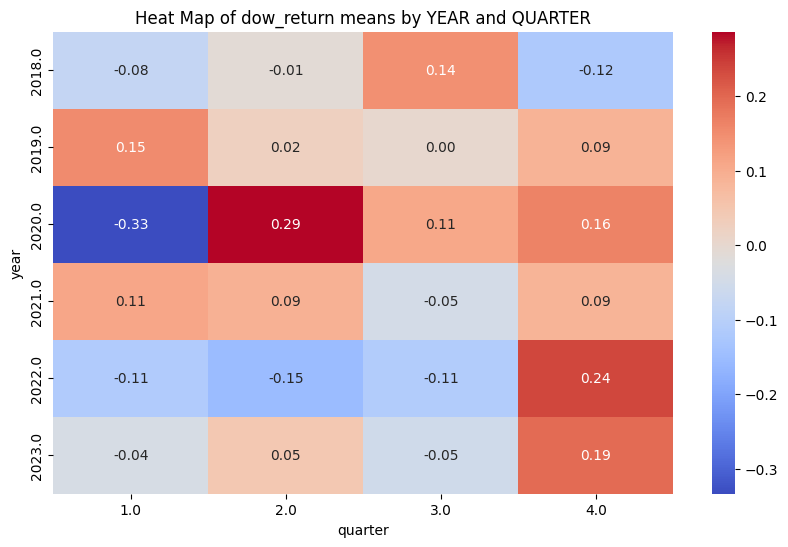

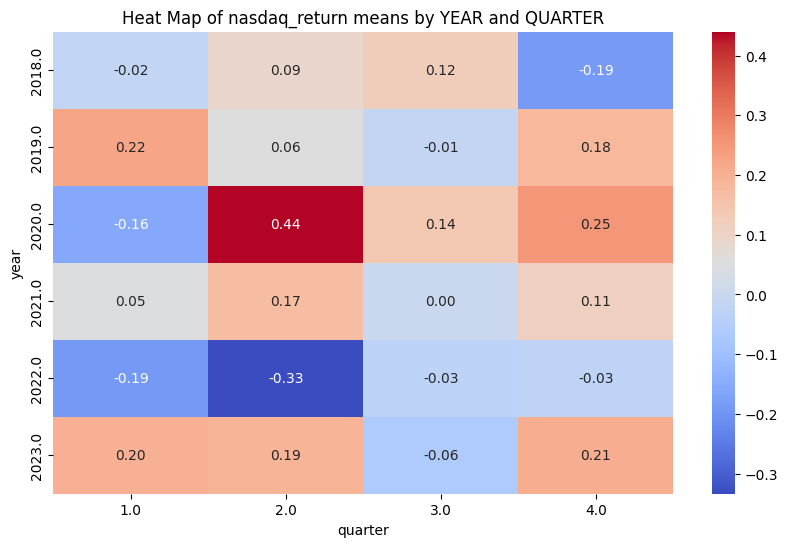

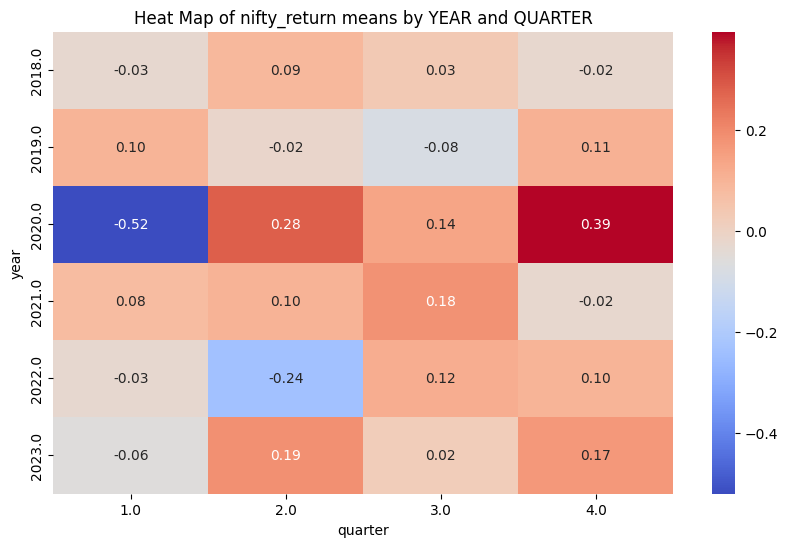

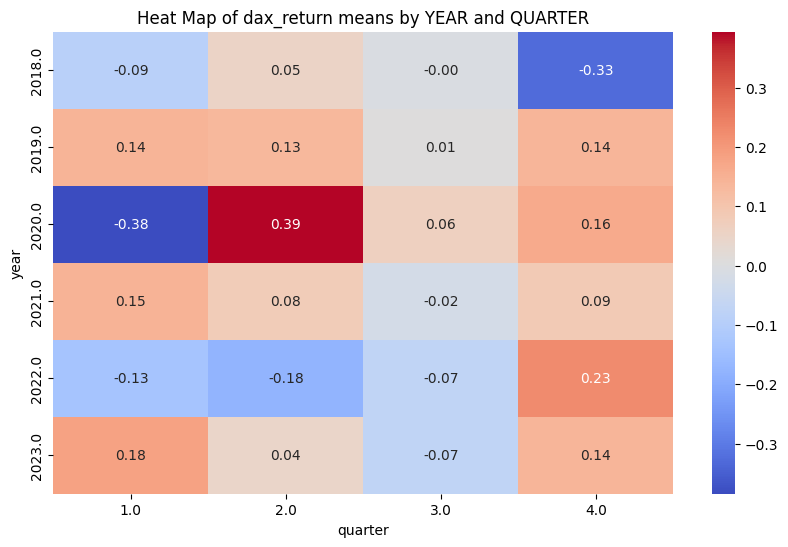

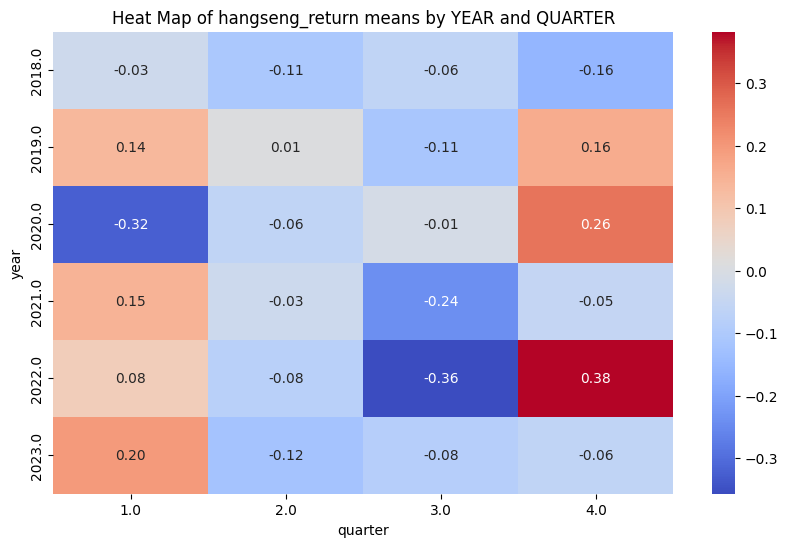

...

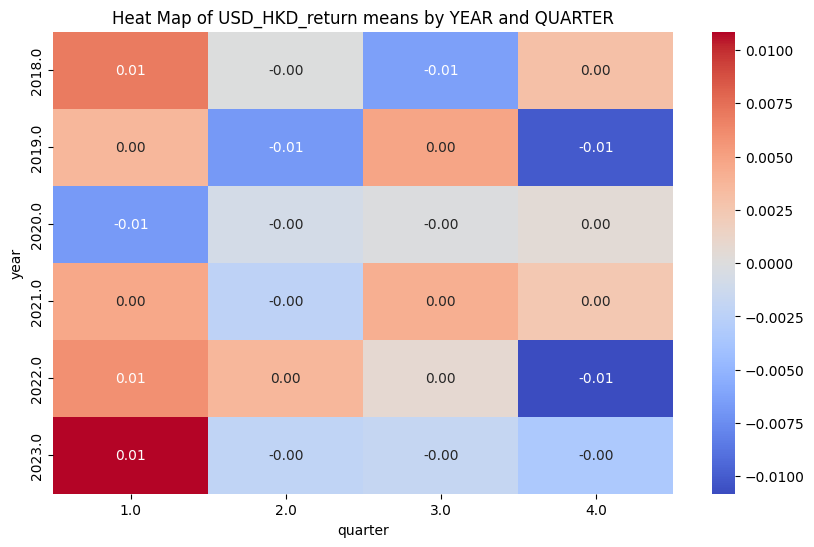

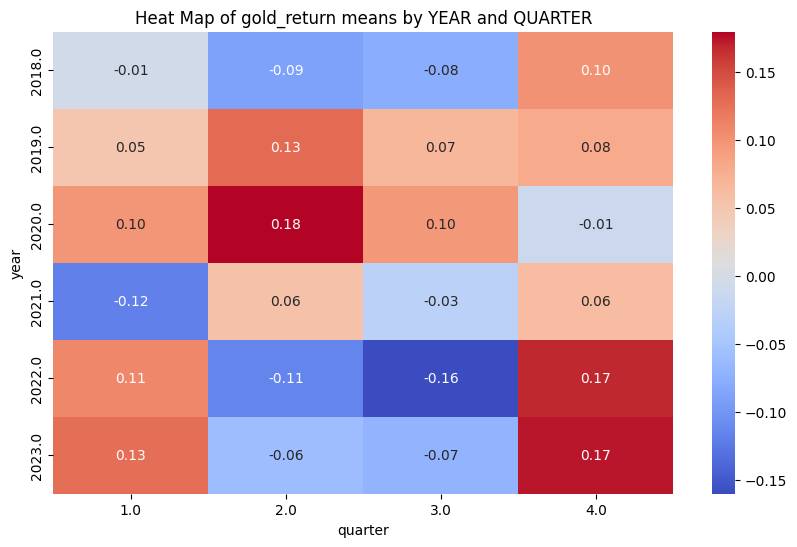

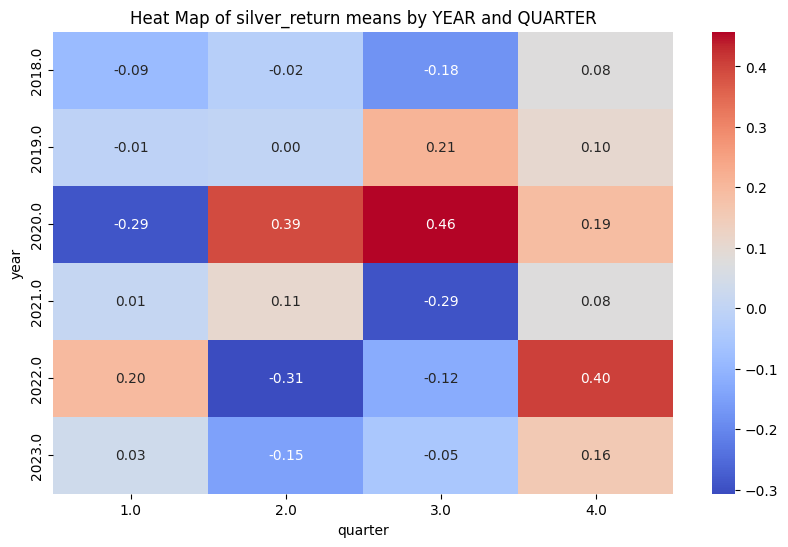

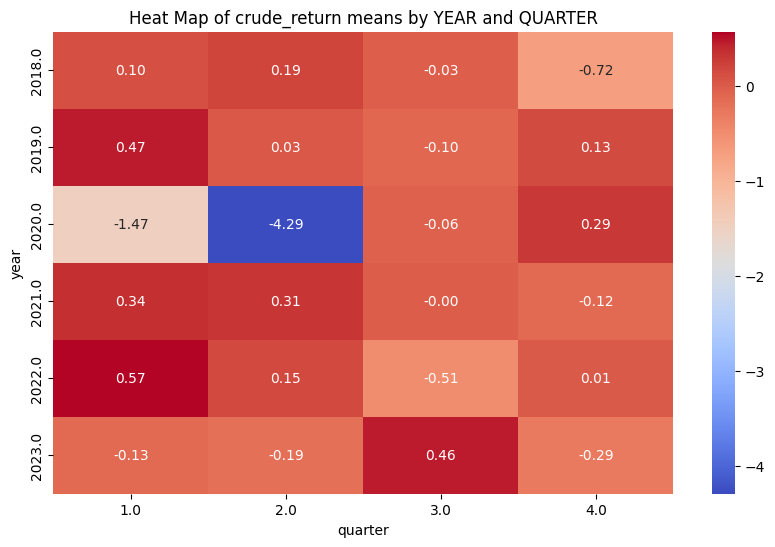

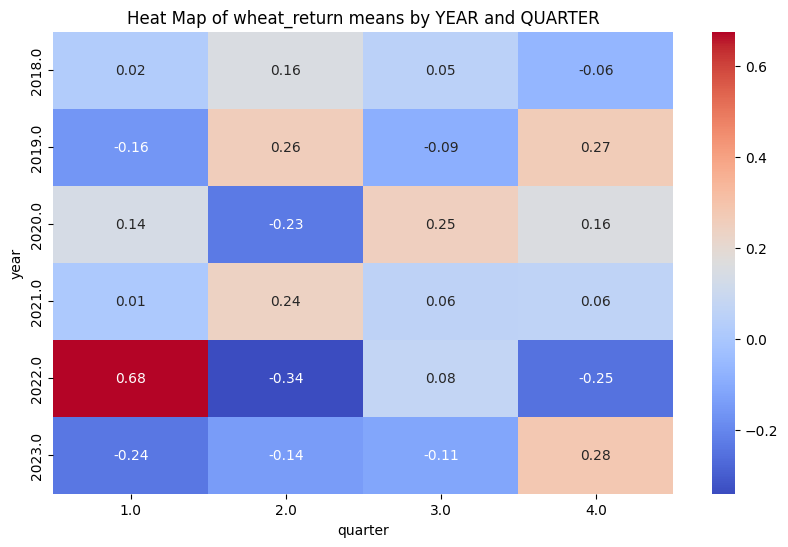

In [ ]:
#%% Part-1-d-1) Heat Map by “YEAR” and “QUARTER” showing mean returns
return_columns = [col for col in masterdata.columns if col.endswith('_return')]

# Filter data for all years and select only return columns
indices_returns = masterdata[return_columns]

for indices in indices_returns:
    pivot_table = masterdata.pivot_table(values=indices, index='year', columns='quarter', aggfunc='mean')
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f")
    plt.title(f'Heat Map of {indices} means by YEAR and QUARTER')
    plt.show()

# Analysis of just stock indices

## Dow Jones Industrial Average (Dow)
- The most significant positive mean returns appear in Q1 and Q2 of 2020, likely reflecting the market's initial recovery from the early 2020 crash.
- Q4 of 2018 and Q2 of 2022 show negative mean returns, indicating periods of downturn.
- Overall, there's a mix of positive and negative quarters without a clear multi-year trend.

## NASDAQ
- The standout quarter is Q2 2020 with a very high mean return, likely a reflection of the strong performance of tech sectors during the pandemic.
- Negative returns are evident in Q4 of 2018 and Q2 of 2022, aligning with downturns in the Dow.
- The NASDAQ appears to have a more pronounced fluctuation between quarters compared to the Dow.

## NIFTY 50 (Nifty)
- Q1 2020 shows a very high mean return, along with several other quarters in 2020 showing strong performance.
- Q2 2021 has a significant positive return, which is not as prominent in the other indices.
- Q2 2022 shows a negative mean return, consistent with the pattern of downturns seen in other indices.

## DAX
- Like the NASDAQ, DAX shows a notable positive return in Q2 2020.
- There are also negative mean returns in Q4 of 2018 and Q2 of 2022.
- A strong recovery appears in Q4 of 2022, which is not observed in the other indices to the same extent.

## Hang Seng Index (Hangseng)
- The highest mean return is in Q4 of 2020, which deviates from the pattern of other indices where Q2 2020 was often the peak.
- Consistently negative mean returns are seen in Q1 and Q3 of 2022, suggesting prolonged periods of underperformance.
- The pattern of returns is somewhat more volatile, with both high positive and negative quarters.

## Nikkei 225 (Nikkei)
- Q4 of 2020 and Q1 of 2023 show high positive mean returns, indicating strong periods.
- The significant negative mean return in Q1 of 2020 could reflect an initial market reaction to the pandemic before recovery.
- Q3 of 2022 also shows a negative mean return, again aligning with the patterns of downturn seen in other indices.

## General Observations
- **Pandemic Recovery**: Most indices show a strong performance in Q2 of 2020, which likely reflects the recovery after the initial shock of the COVID-19 pandemic.
- **2022 Challenges**: Several indices experienced downturns in Q2 of 2022, indicating a challenging period across global markets.
- **Recovery Signs**: Some indices, like the DAX and Nikkei, show signs of recovery in the last quarters of 2022 or early 2023.
- **Variability**: There is significant variability both within and between indices, suggesting that market conditions and investor sentiment can change rapidly within a year.

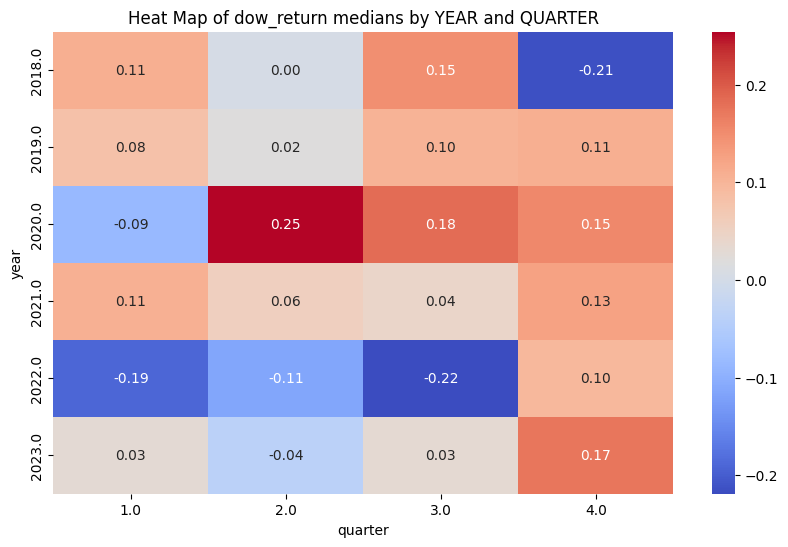

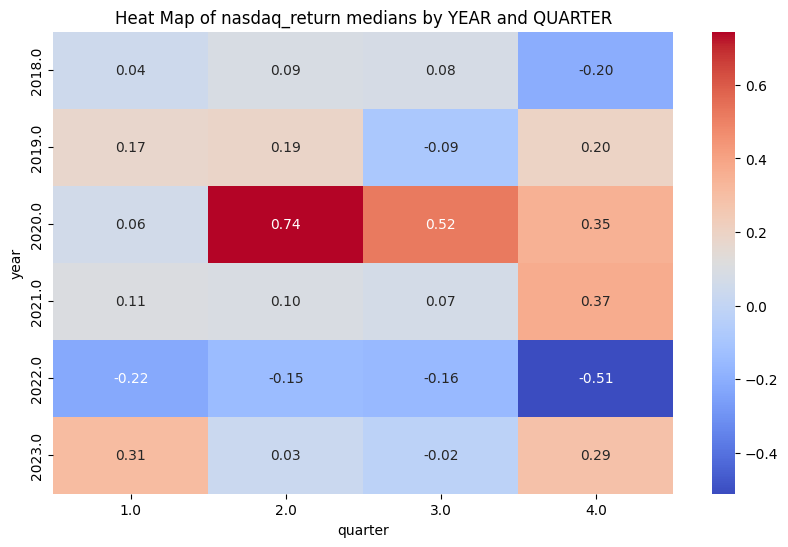

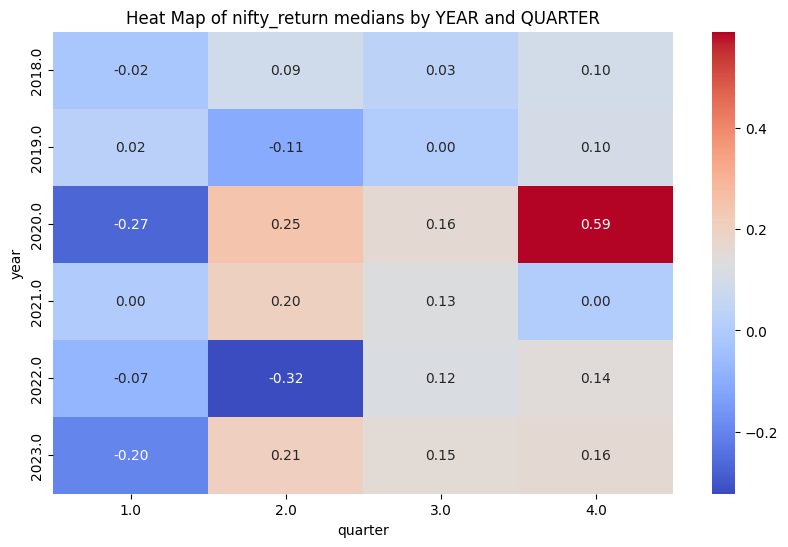

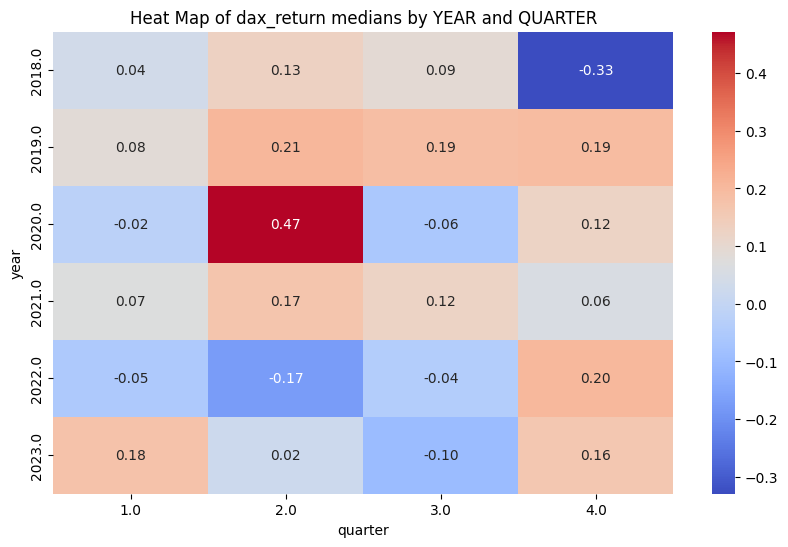

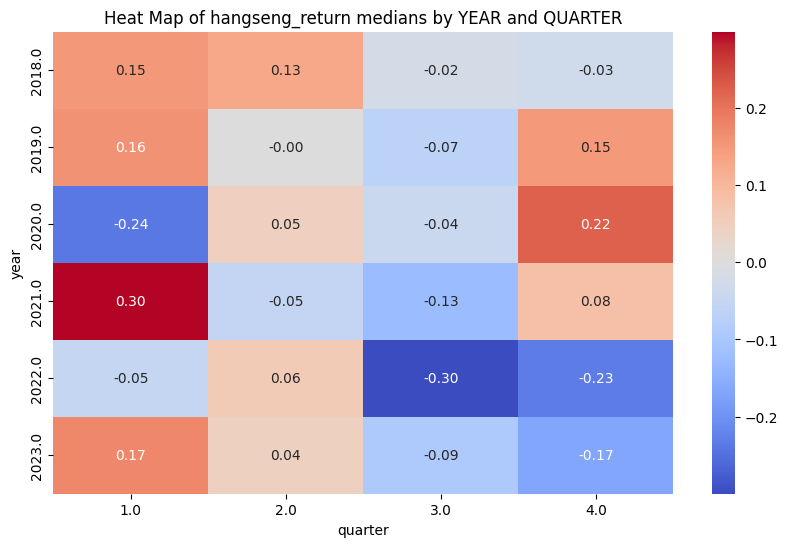

...

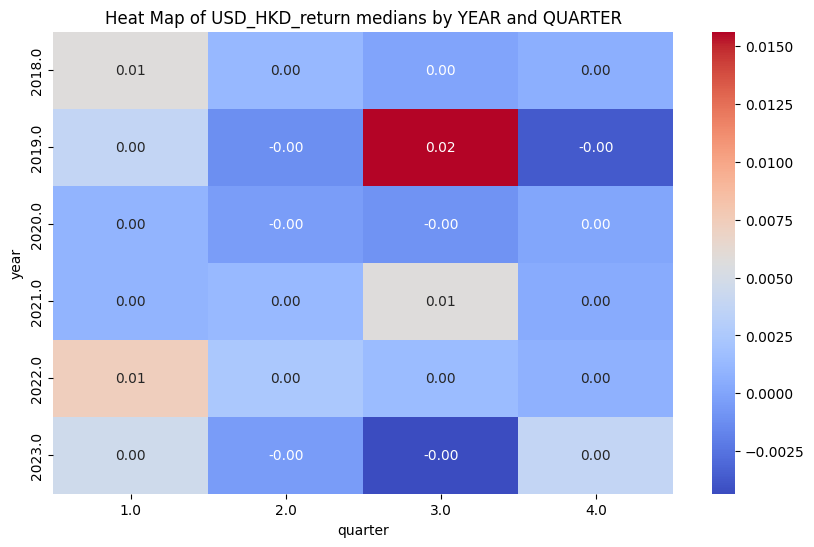

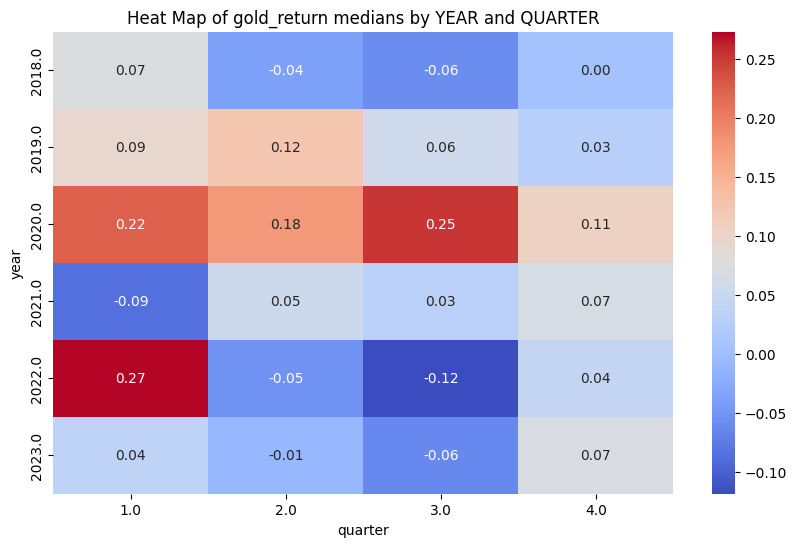

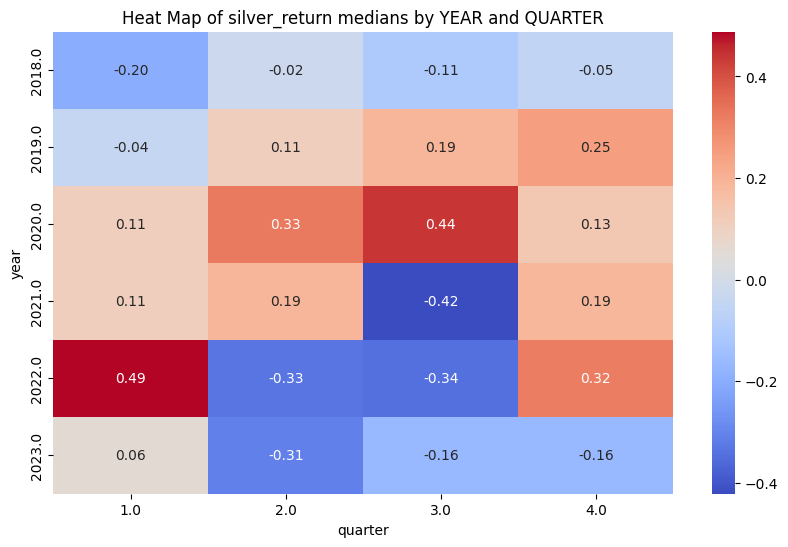

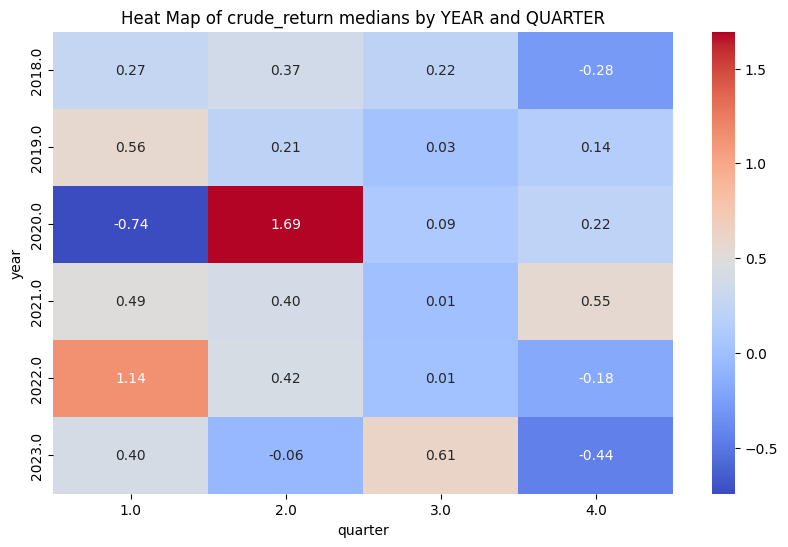

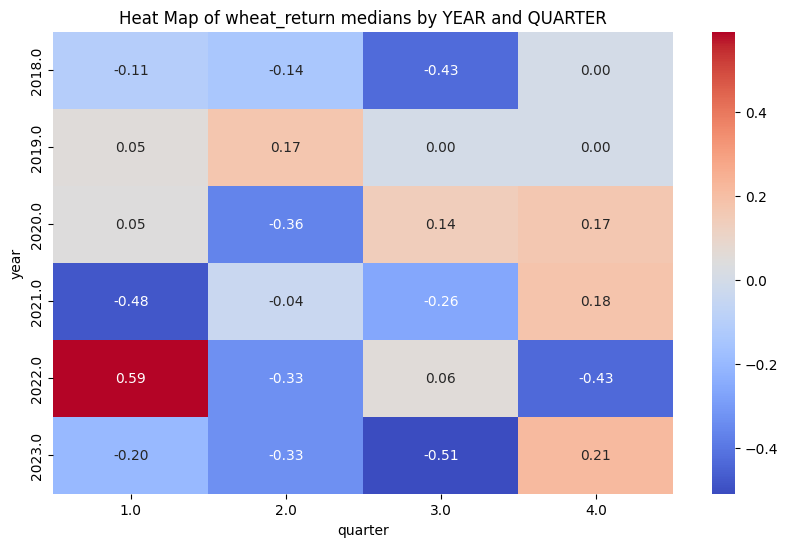

In [ ]:
#%% Part-1-d-2) Heat Map by “YEAR” and “QUARTER” showing median returns
return_columns = [col for col in masterdata.columns if col.endswith('_return')]

# Filter data for all years and select only return columns
indices_returns = masterdata[return_columns]

for indices in indices_returns:
    pivot_table = masterdata.pivot_table(values=indices, index='year', columns='quarter', aggfunc='median')
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f")
    plt.title(f'Heat Map of {indices} medians by YEAR and QUARTER')
    plt.show()

# Analysis of just stock indices

The heat maps show the median returns by quarter and year for the six stock indices. Unlike mean returns, median returns are not influenced by outliers and provide a better sense of typical market performance.

## Dow Jones Industrial Average (Dow)
- The most significant positive median returns appear in Q4 2019 and Q3 2021.
- The Q4 of 2018 and Q1 of 2020 show negative median returns, indicating those were typically weaker quarters.
- The heatmap colors indicate a mix of positive and negative performance, with no clear year-over-year trend.

## NASDAQ
- This index shows particularly strong median returns in Q3 2020 and Q4 of the same year, likely reflecting the recovery and growth in tech stocks during that time.
- The Q4 of 2018 and Q1 of 2020 are also negative, mirroring the trend seen in the Dow.
- Q2 of 2022 stands out with a significantly negative median return, suggesting a tougher period for the index.

## NIFTY 50 (Nifty)
- Nifty shows a marked positive median return in Q1 2020, and a notable peak in Q3 2021.
- Q2 of 2022 exhibits a highly negative median return, consistent with the downturns observed in other indices for this period.
- The heatmap indicates a somewhat volatile performance, with both strong positive and negative quarters.

## DAX
- DAX displays its highest median returns in Q1 and Q4 of 2019, suggesting a strong performance in those quarters.
- A significantly negative median return is observed in Q4 of 2018.
- The heatmap colors are mixed across the years, showing a combination of positive and negative quarters without a consistent pattern.

## Hang Seng Index (Hangseng)
- Hangseng’s heatmap shows several quarters of negative median returns, with Q3 of 2020 and Q1 and Q3 of 2022 being the most notable.
- However, there are also high positive median returns in Q4 of 2018 and Q4 of 2020.
- The heatmap indicates variability in performance with both strong positive and negative quarters.

## Nikkei 225 (Nikkei)
- Q3 of 2020 and Q4 of 2023 for Nikkei indicate very high median returns.
- Q1 of 2020, like the Dow and NASDAQ, shows a negative median return, which could be due to the pandemic.
- The pattern in the Nikkei heatmap suggests alternating periods of positive and negative median returns, highlighting market fluctuations.

## General Observations
- **Varying Performance**: Unlike the mean returns, the median returns vary more significantly between the indices, indicating that while some markets may have experienced extreme values, the central tendency was not always aligned.
- **2020 Performance**: While 2020 had a volatile start with the pandemic, it also had quarters with strong recoveries, as seen in the positive median returns.
- **Challenges in 2022**: The second quarter of 2022 appears challenging for most indices, which may indicate global market stress.
- **Mixed Trends**: There isn't a clear trend across the indices, suggesting diverse underlying factors influencing each market differently.

# Part-2: Global Indices-Correlation Analysis

## Global Indices-Correlation Analysis
    # a) Correlation Matrix of 6 years daily returns (6 by 6 matrix)
    # b) Correlation Matrix of one year (2023) daily returns (6 by 6 matrix)

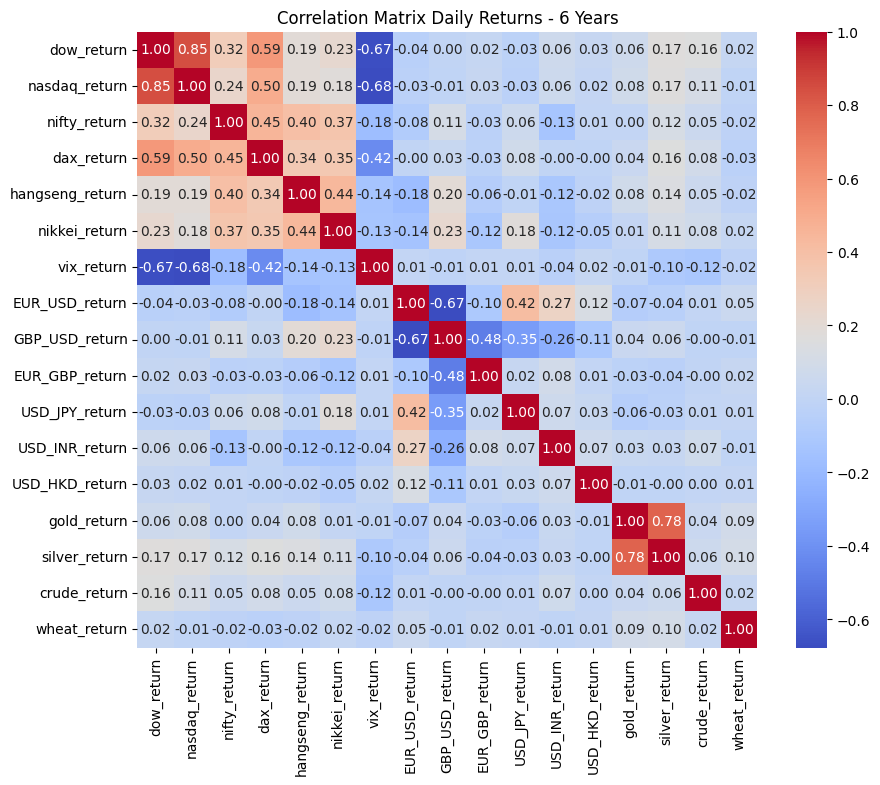

In [ ]:
#%% Part-2-a) Correlation Matrix of 6 years daily returns (6 by 6 matrix)

# Select all return columns
return_columns = [col for col in masterdata.columns if col.endswith('_return')]

# Filter data for all years and select only return columns
indices_returns = masterdata[return_columns]

# Calculate the correlation matrix
corr_matrix = indices_returns.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Daily Returns - 6 Years')
plt.show()

## Stock Indices Correlation:
* The Dow Jones (dow_return), NASDAQ (nasdaq_return), NIFTY (nifty_return), DAX (dax_return), Hang Seng (hangseng_return), and Nikkei (nikkei_return) mostly show positive correlations with each other, which makes sense as global stock markets often move in tandem due to global economic factors and investor sentiment.
* VIX (vix_return), which is often called the "fear index," generally has negative correlations with the stock indices. This is typical because the VIX tends to rise when the market falls, reflecting increased volatility or investor uncertainty.

## Currency Exchange Rates:
* Currency pairs (e.g., EUR_USD_return, GBP_USD_return) exhibit varying degrees of correlation. Notably, some currency pairs like EUR_GBP_return and GBP_USD_return show a significant positive correlation, which indicates that these currencies often move in the same direction relative to the USD.
* There's also a notable negative correlation between the VIX and several currency pairs, which may suggest that these currencies tend to strengthen against the dollar when market volatility increases.

## Commodities:
* Gold (gold_return) and silver (silver_return) have a high positive correlation, which is typical since they are both precious metals and often react similarly to market conditions.
* Crude oil (crude_return) shows a positive correlation with various stock indices, possibly implying that when the markets are doing well, the demand for oil increases, thus increasing its price.
* The correlations between wheat (wheat_return) and other instruments are generally low, indicating that wheat prices may be influenced by factors more specific to the agricultural sector than broader market trends.

## Strength of Correlation:
* Strong correlations are indicated by colors closer to red (positive) and blue (negative). The strength of these correlations can be influenced by economic events, policy changes, geopolitical issues, etc.
* Weak or no correlations are indicated by colors closer to white.

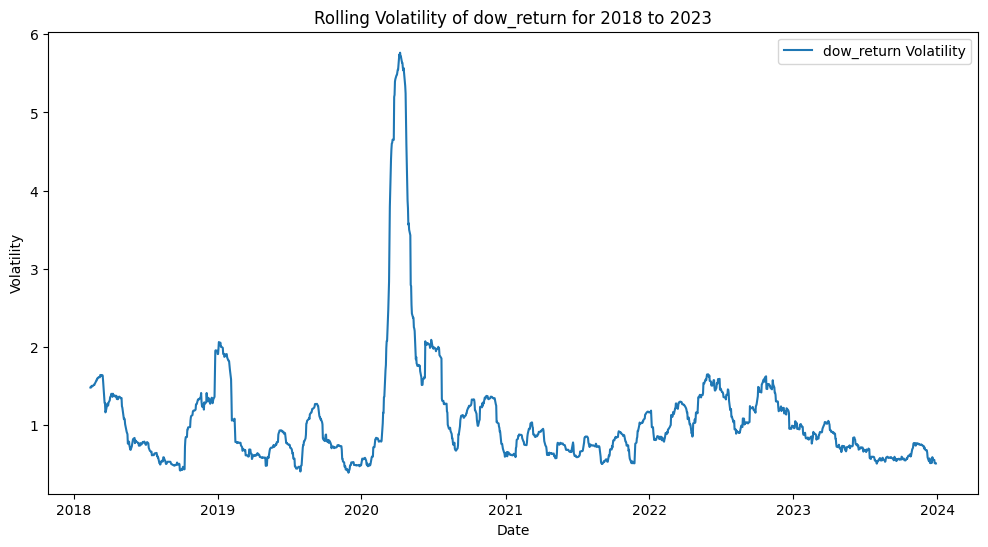

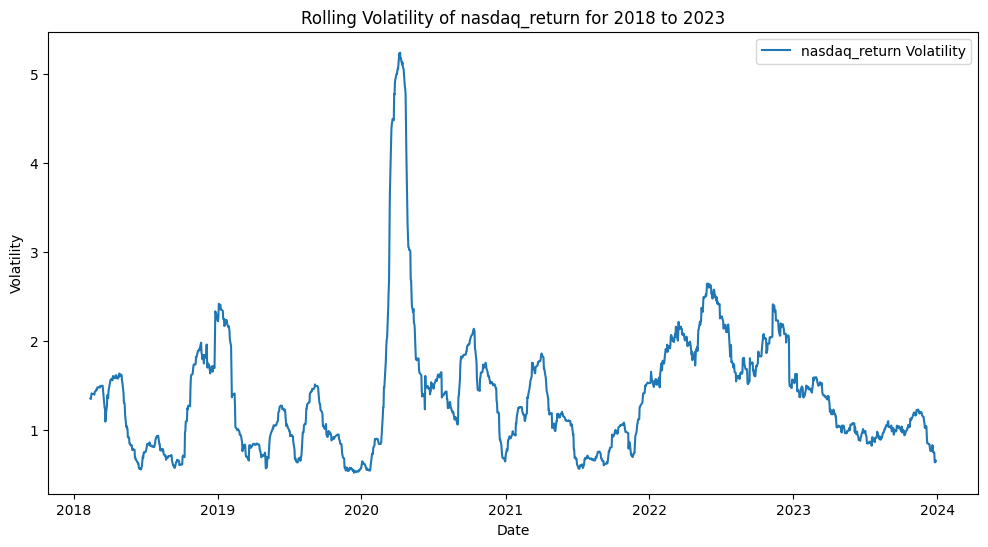

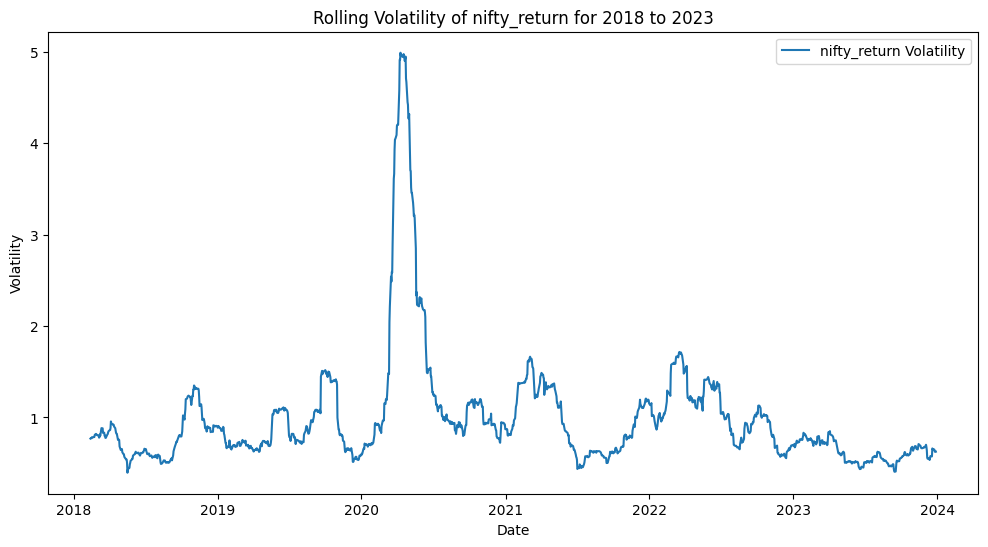

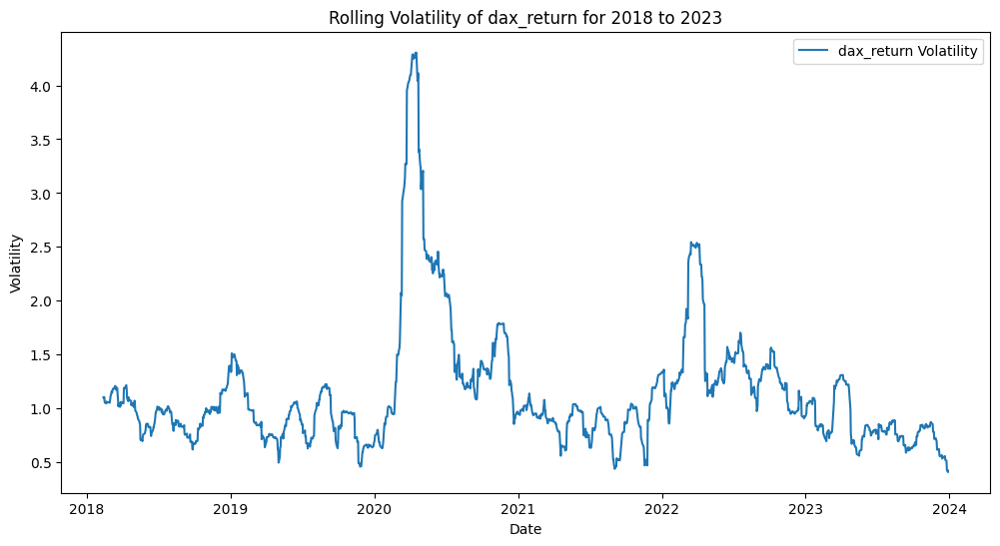

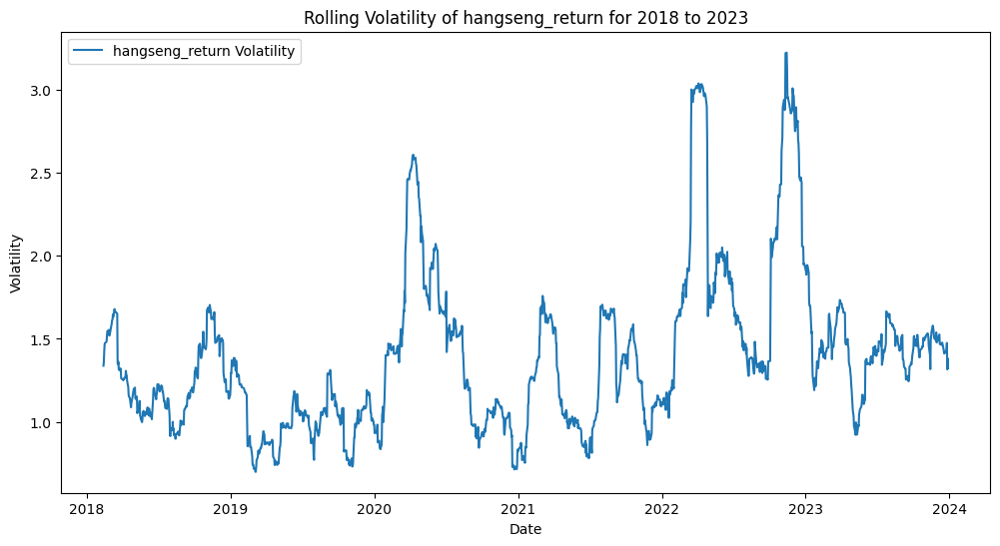

...

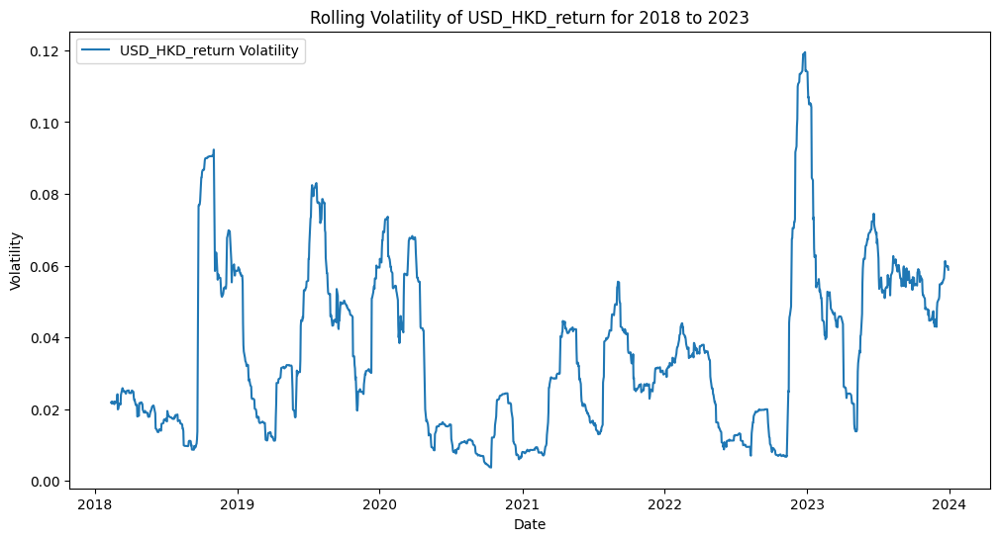

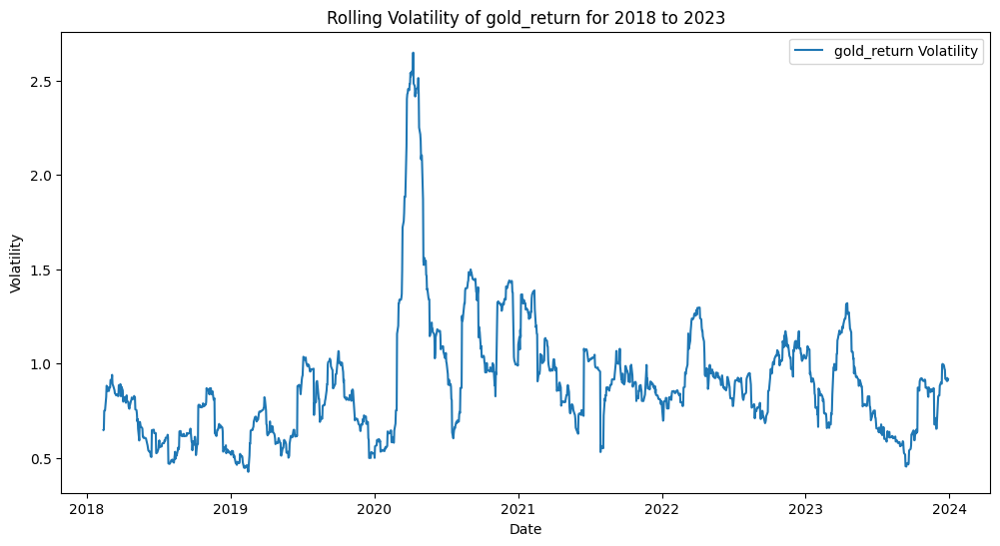

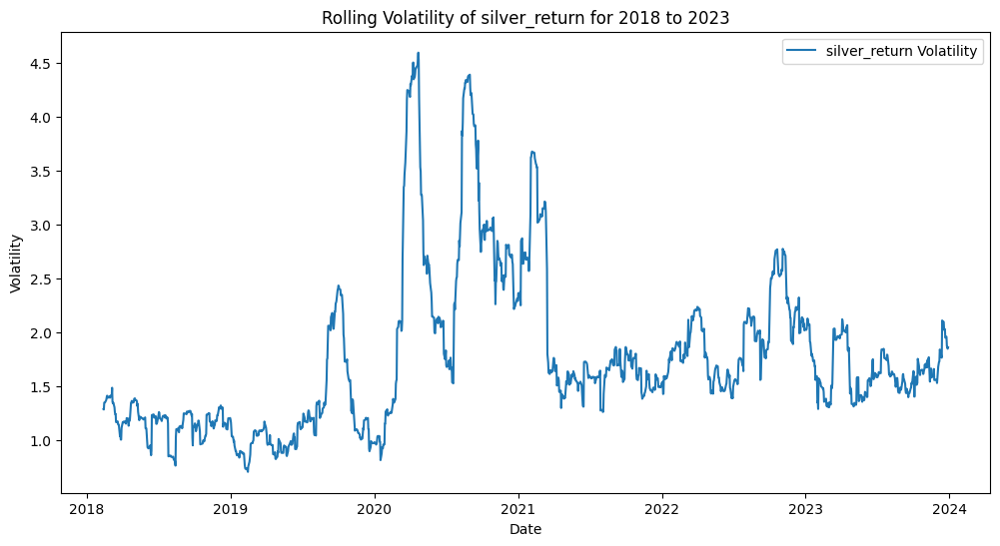

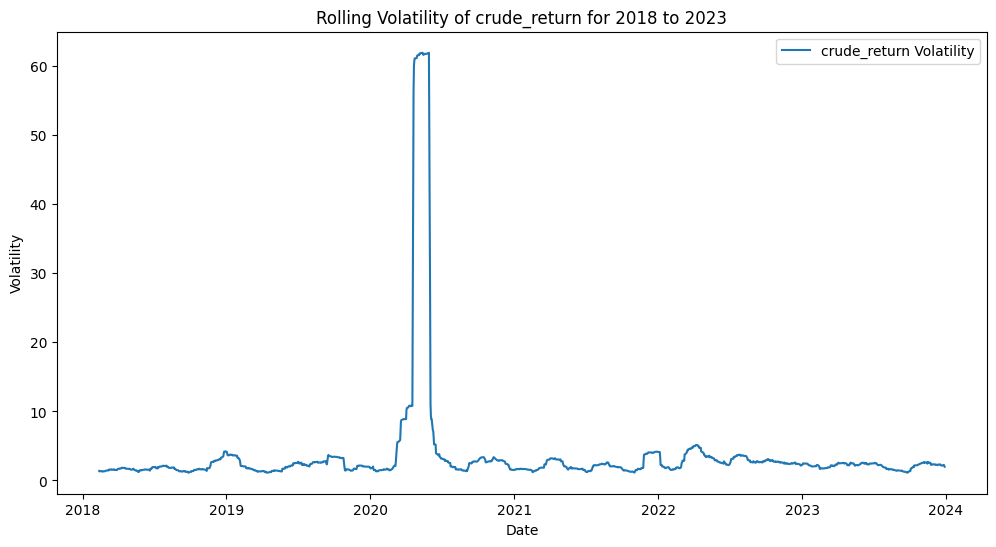

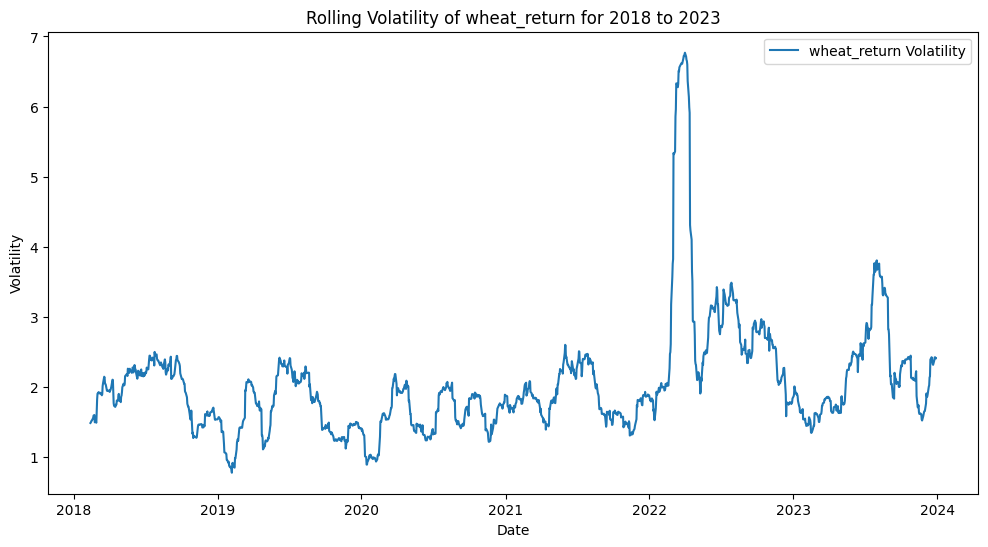

In [ ]:
masterdata['Date'] = pd.to_datetime(masterdata['Date'])


#%% Part-3-a) Create rolling volatility index

# Calculate rolling volatility for 2020 data for each return column
# Assuming a 30-day rolling window for volatility calculation
rolling_window = 30

# Select all return columns
return_columns = [col for col in masterdata.columns if '_return' in col]

# Calculate rolling volatility for all return columns
for column in return_columns:
    masterdata[f'{column}_volatility'] = masterdata[column].rolling(window=rolling_window).std()


#%% Part-3-b) Plot of rolling volatility index for 2018 to 2023

for column in return_columns:
    plt.figure(figsize=(12, 6))
    plt.plot(masterdata['Date'], masterdata[f'{column}_volatility'], label=f'{column} Volatility')
    plt.title(f'Rolling Volatility of {column} for 2018 to 2023')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()

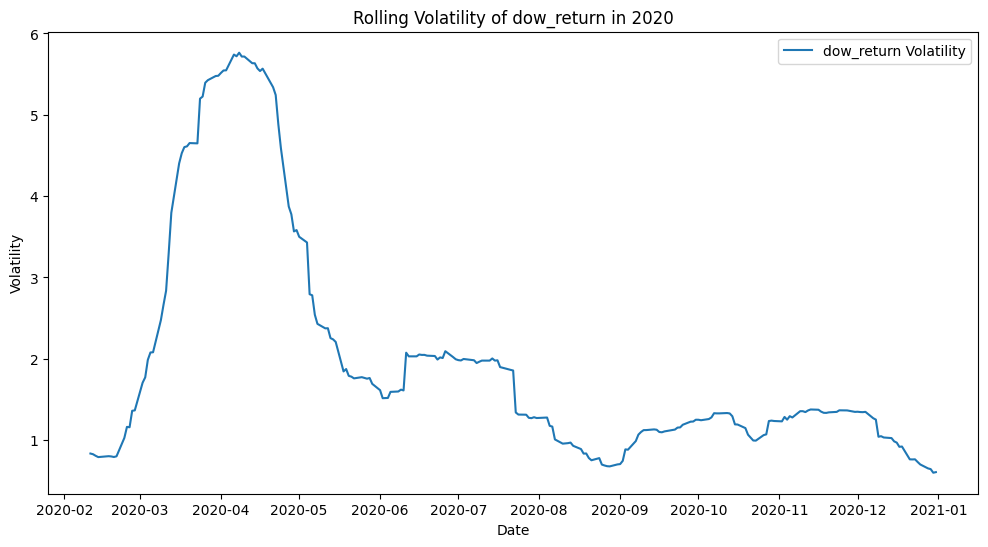

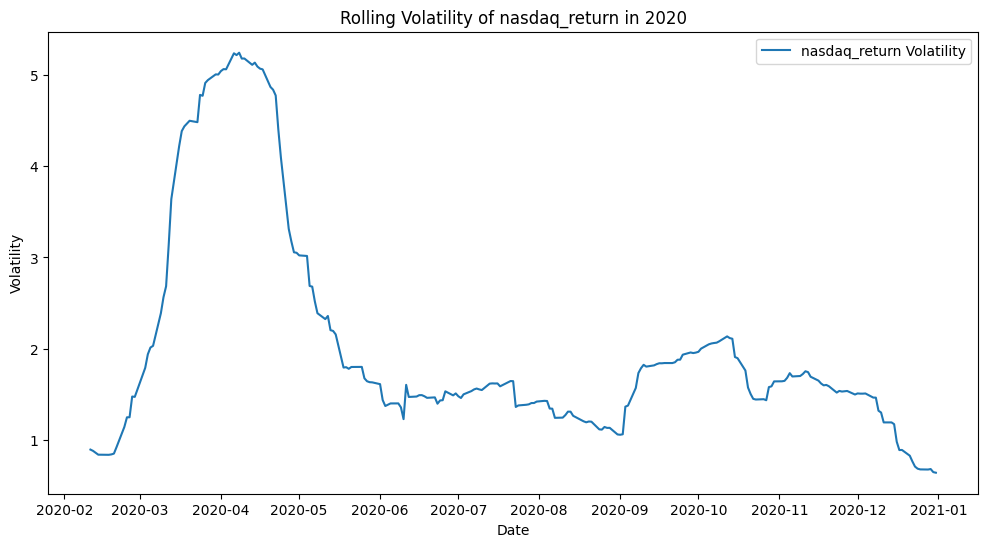

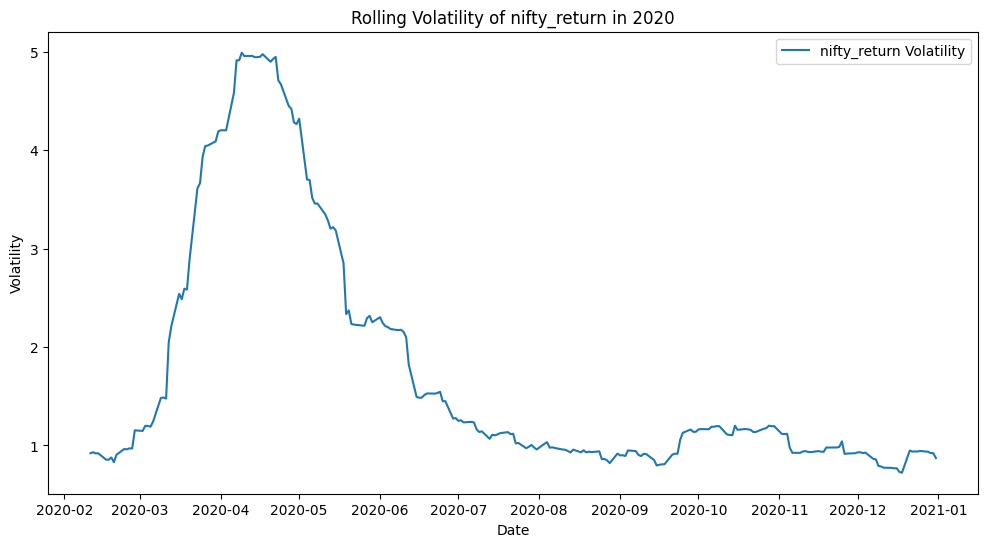

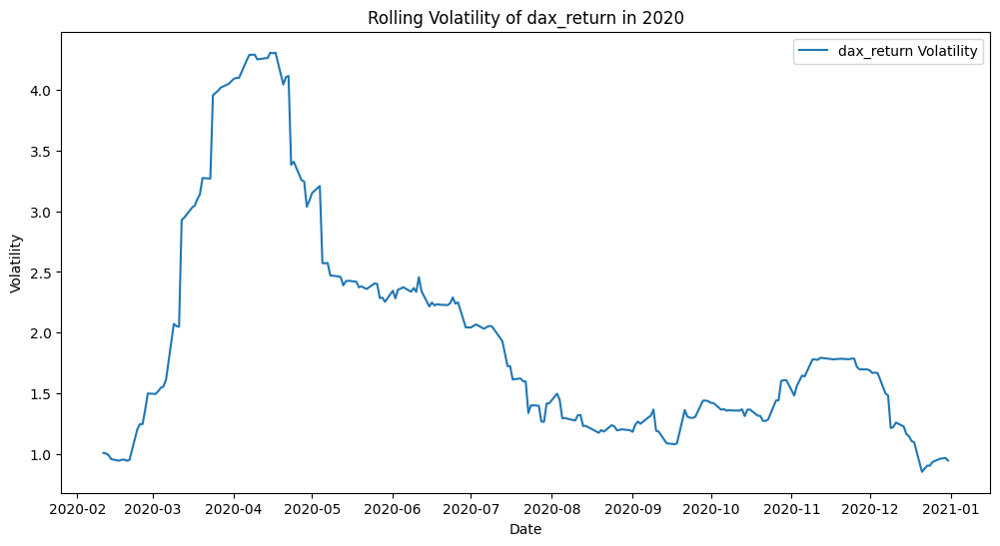

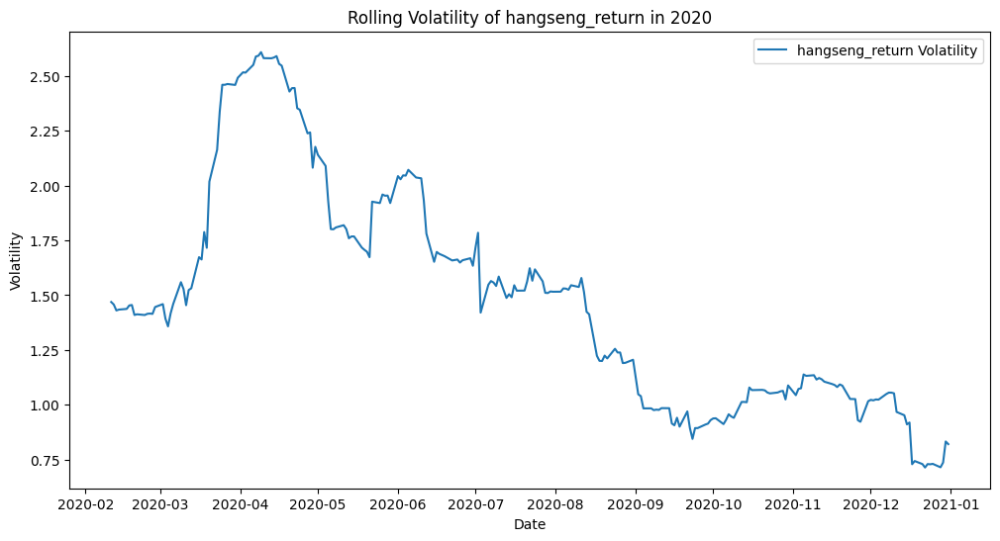

...

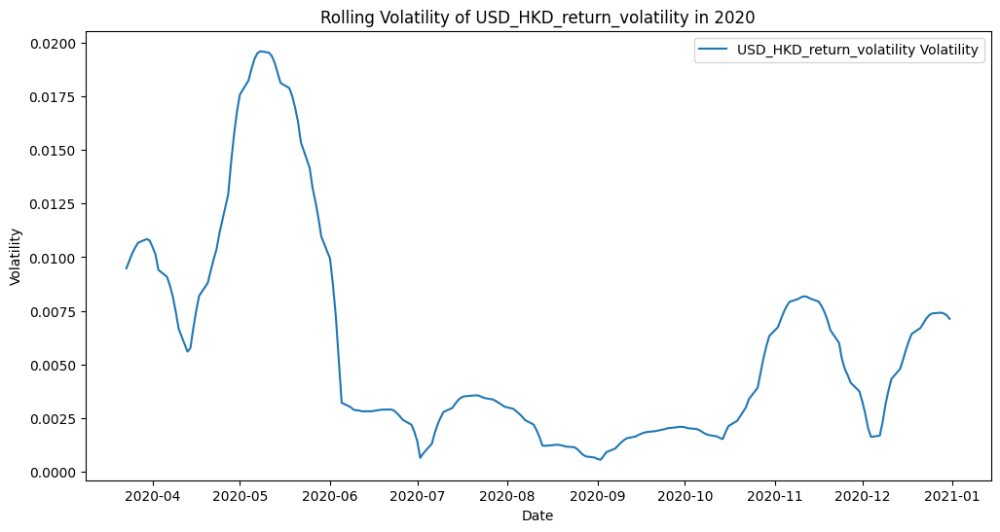

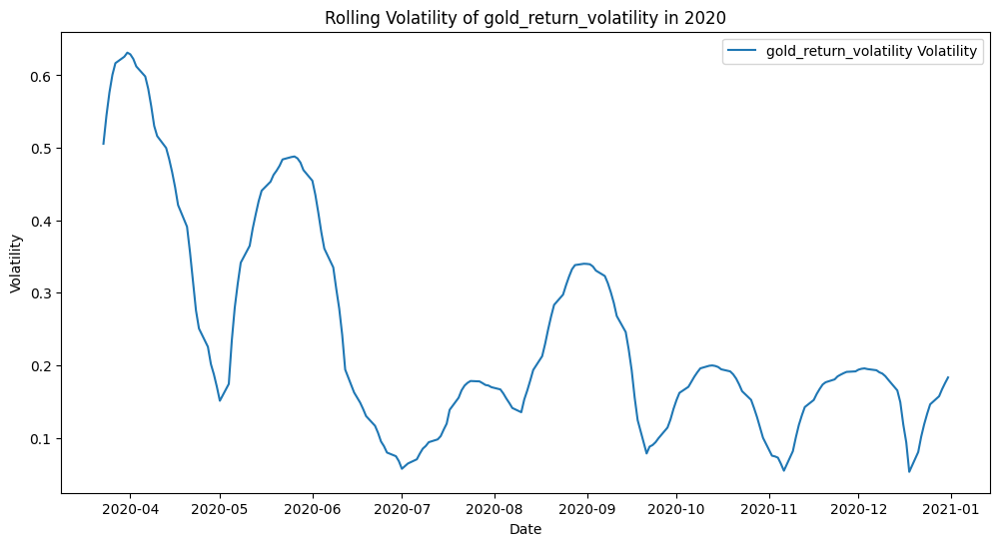

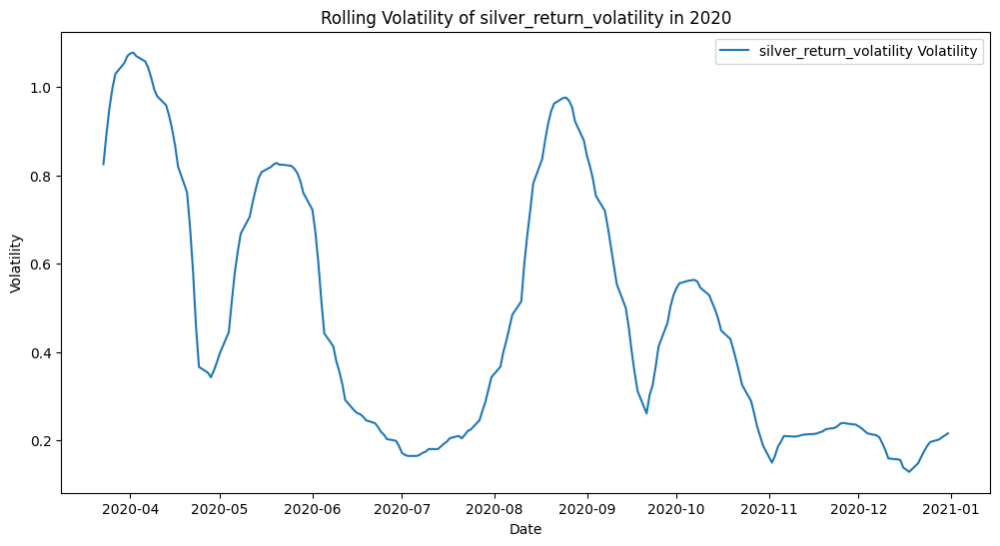

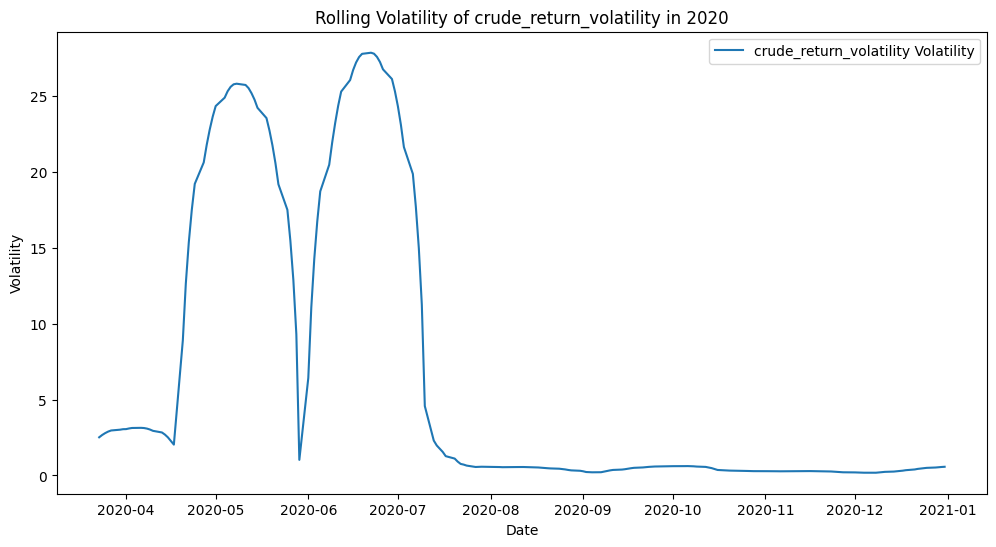

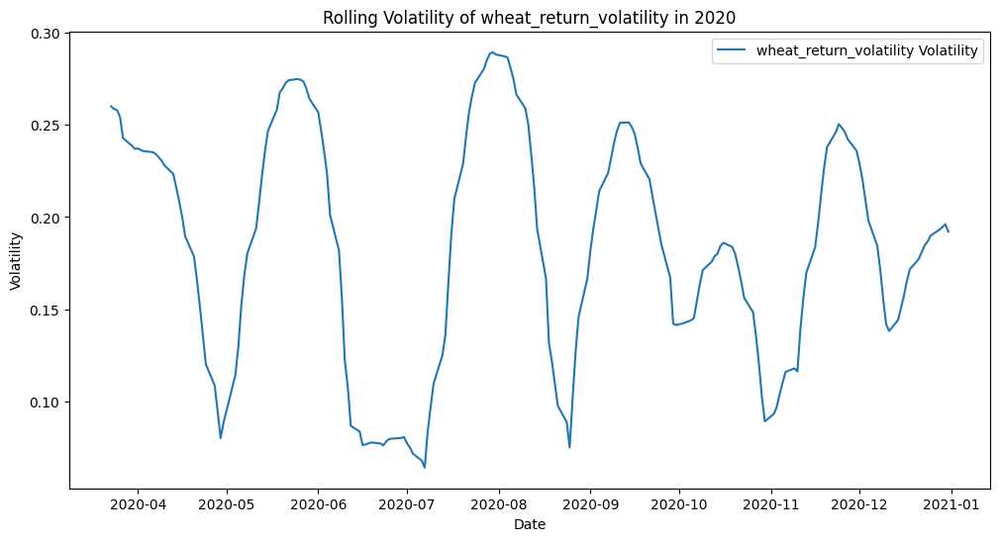

In [ ]:
#%% Part-3-c) Plot of rolling volatility index for 2020

# Ensure 'Date' is a datetime type if not already
masterdata['Date'] = pd.to_datetime(masterdata['Date'])

# Calculate rolling volatility for 2020 data for each return column
# Assuming a 30-day rolling window for volatility calculation
rolling_window = 30

# Select all return columns
return_columns = [col for col in masterdata.columns if '_return' in col]

# Filter data for 2020
masterdata_2020 = masterdata[masterdata['Date'].dt.year == 2020]

# Calculate rolling volatility for all return columns
for column in return_columns:
    masterdata_2020[f'{column}_volatility'] = masterdata_2020[column].rolling(window=rolling_window).std()

# Plot rolling volatility for each return column
for column in return_columns:
    plt.figure(figsize=(12, 6))
    plt.plot(masterdata_2020['Date'], masterdata_2020[f'{column}_volatility'], label=f'{column} Volatility')
    plt.title(f'Rolling Volatility of {column} in 2020')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()

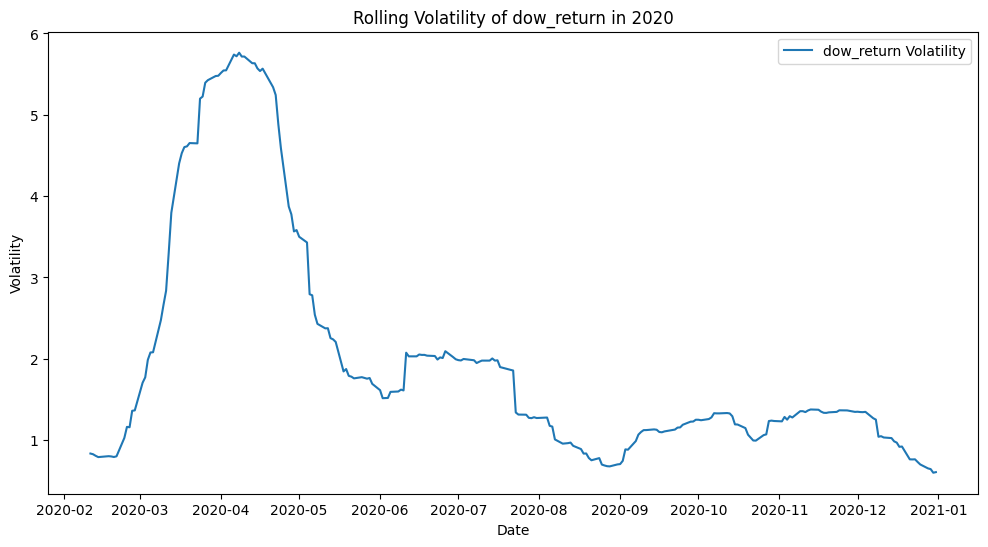

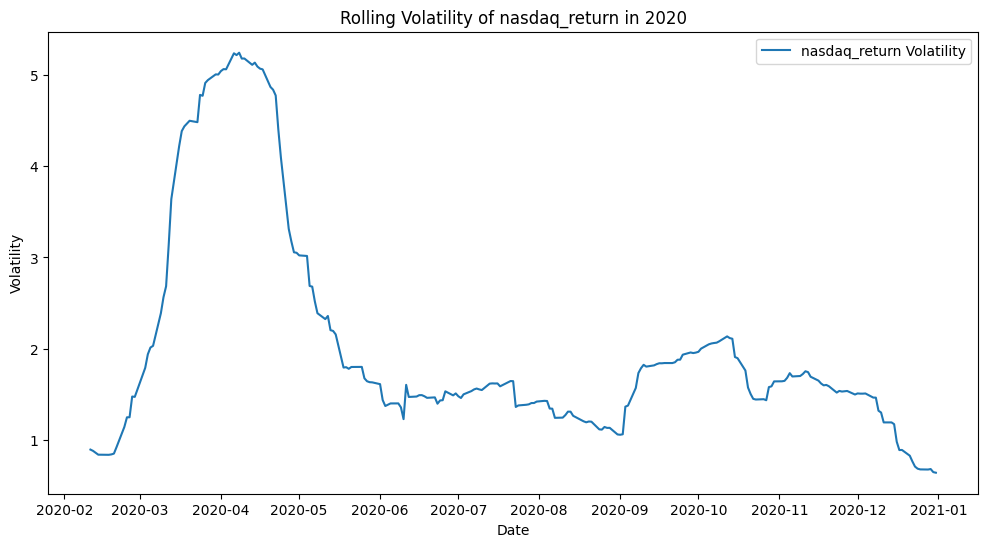

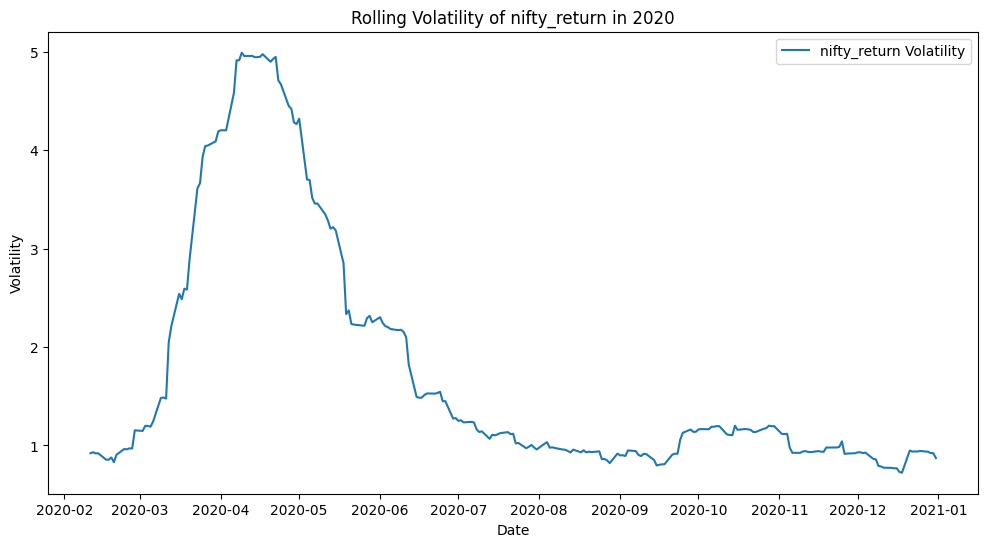

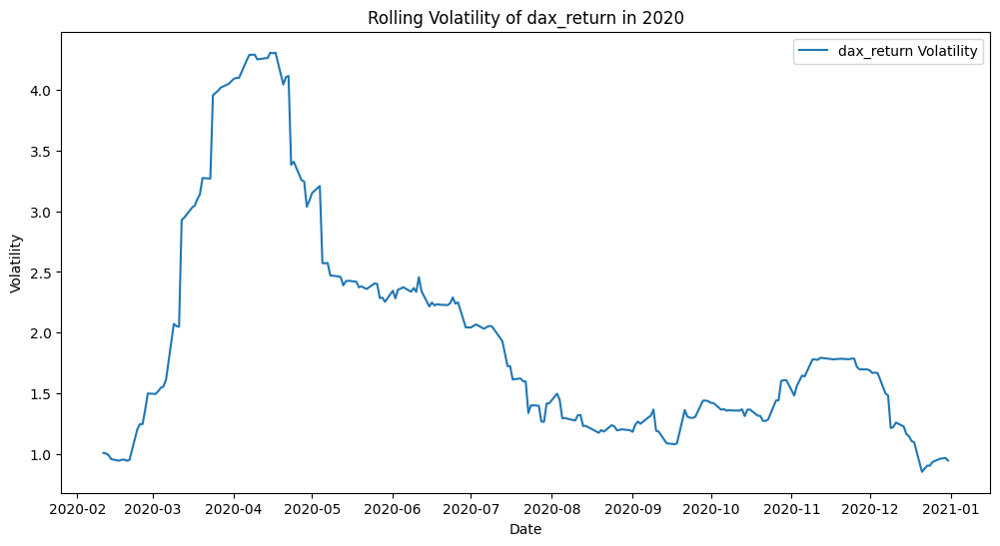

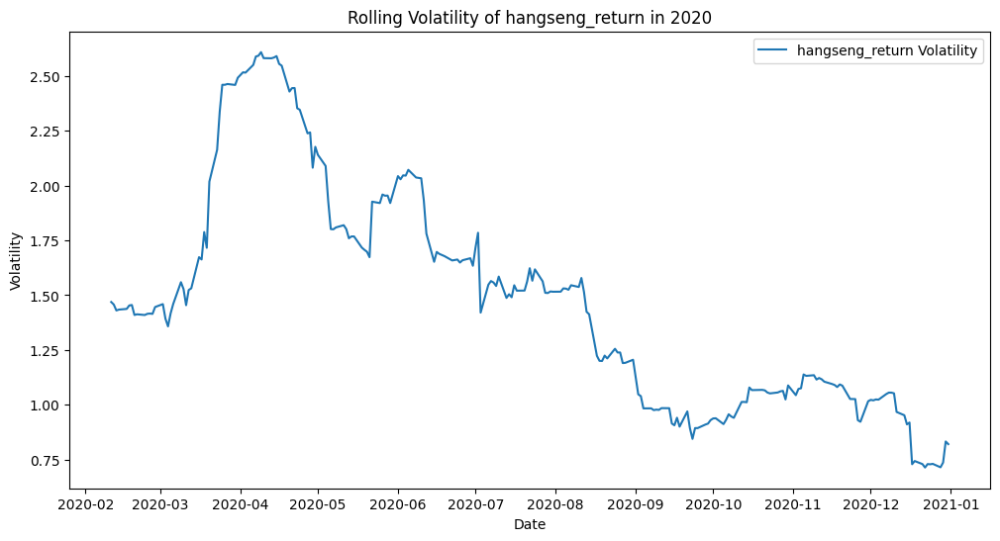

...

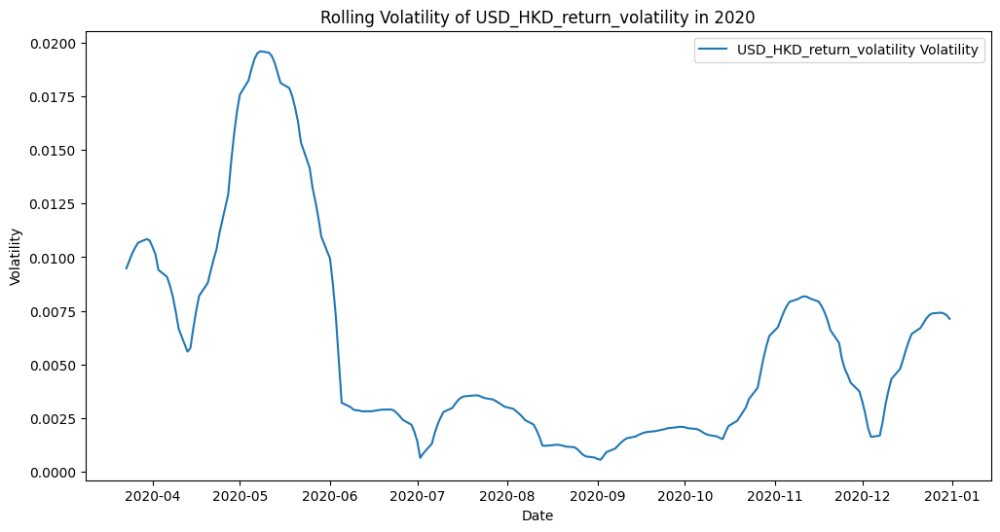

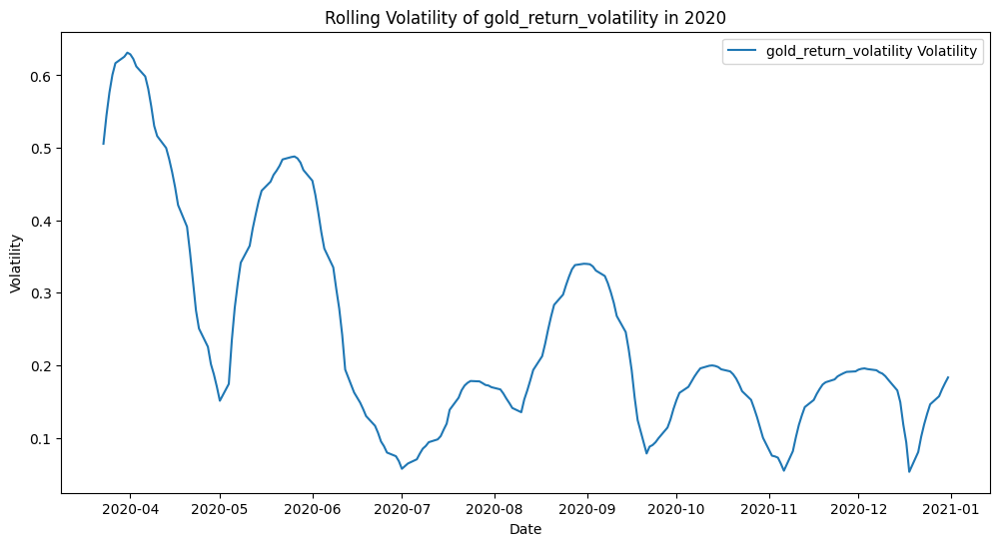

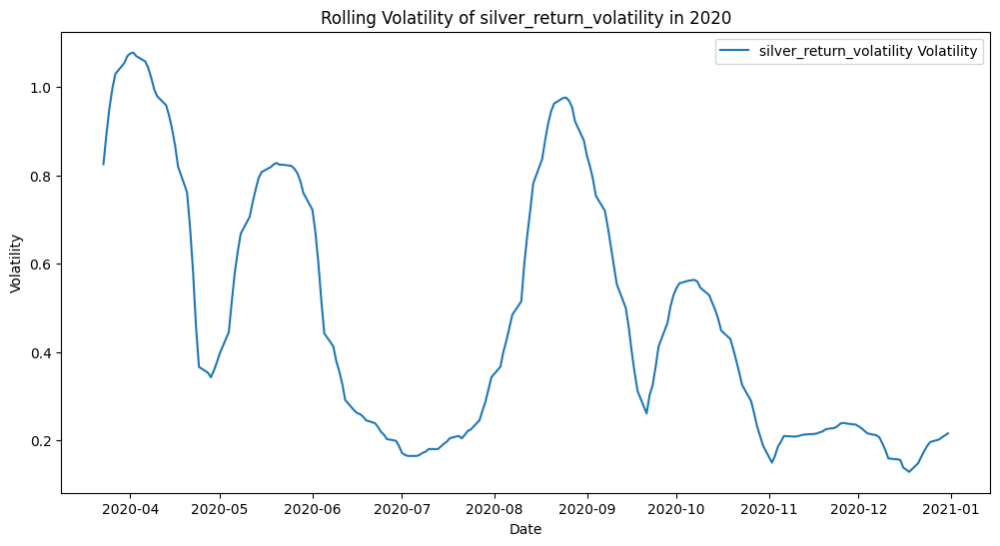

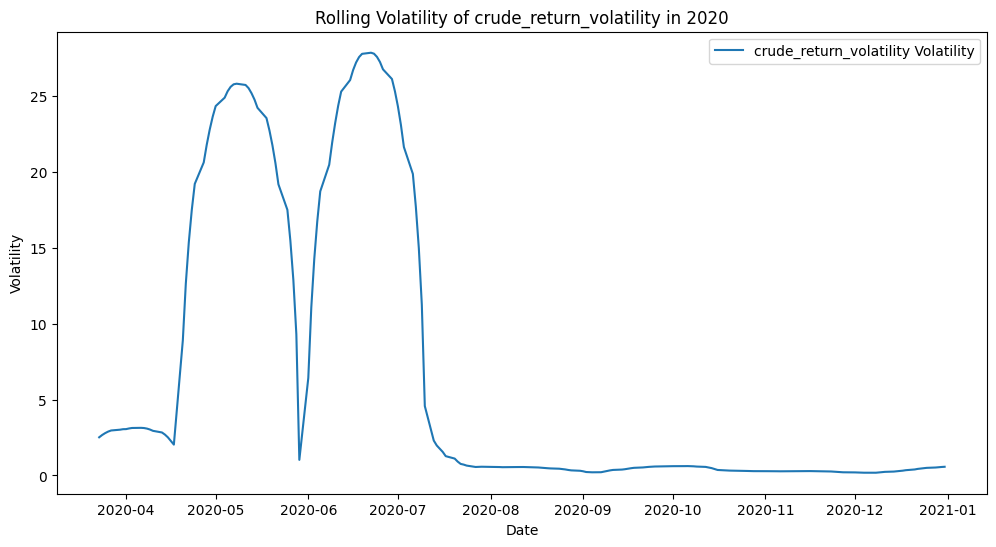

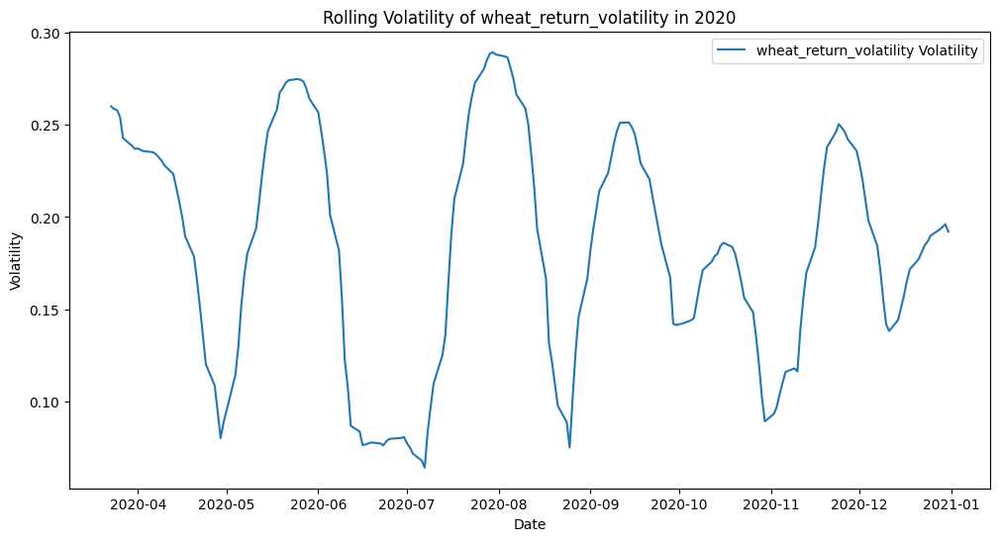

In [ ]:
#%% Part-3-c) Plot of rolling volatility index for 2020

# Ensure 'Date' is a datetime type if not already
masterdata['Date'] = pd.to_datetime(masterdata['Date'])

# Calculate rolling volatility for 2020 data for each return column
# Assuming a 30-day rolling window for volatility calculation
rolling_window = 30

# Select all return columns
return_columns = [col for col in masterdata.columns if '_return' in col]

# Filter data for 2020
masterdata_2020 = masterdata[masterdata['Date'].dt.year == 2020]

# Calculate rolling volatility for all return columns
for column in return_columns:
    masterdata_2020[f'{column}_volatility'] = masterdata_2020[column].rolling(window=rolling_window).std()

# Plot rolling volatility for each return column
for column in return_columns:
    plt.figure(figsize=(12, 6))
    plt.plot(masterdata_2020['Date'], masterdata_2020[f'{column}_volatility'], label=f'{column} Volatility')
    plt.title(f'Rolling Volatility of {column} in 2020')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()

In [ ]:

#%% Part-3-d)

# Assuming 'masterdata' DataFrame contains a 'Date' column and return columns for each index
masterdata['Date'] = pd.to_datetime(masterdata['Date'])

# Splitting the data
pre_covid_data = masterdata[masterdata['Date'] < '2020-03-11']
post_covid_data = masterdata[masterdata['Date'] >= '2020-03-11']

# Selecting only return columns
return_columns = [col for col in masterdata.columns if '_return' in col]

# Calculating the mean daily volatility for each index
pre_covid_vol = pre_covid_data[return_columns].std()
post_covid_vol = post_covid_data[return_columns].std()

# Example analysis output
print("Pre-COVID Volatility:")
print(pre_covid_vol)
print("\nPost-COVID Volatility:")
print(post_covid_vol)

# Pre-COVID Volatility:
# dow_return          1.133063
# nasdaq_return       1.282595
# nifty_return        0.901048
# dax_return          1.042910
# hangseng_return     1.164703
# nikkei_return       1.146242
# vix_return         10.257486
# EUR_USD_return      0.390337
# GBP_USD_return      0.519965
# EUR_GBP_return      0.435605
# USD_JPY_return      0.424663
# USD_INR_return      0.484089
# USD_HKD_return      0.045599
# gold_return         0.750752
# silver_return       1.271158
# crude_return        2.422387
# wheat_return        1.770377
# dtype: float64

# Post-COVID Volatility:
# dow_return          1.365353
# nasdaq_return       1.670466
# nifty_return        1.304012
# dax_return          1.383382
# hangseng_return     1.613909
# nikkei_return       1.288834
# vix_return          7.906932
# EUR_USD_return      0.491441
# GBP_USD_return      0.618408
# EUR_GBP_return      0.664207
# USD_JPY_return      0.567177
# USD_INR_return      0.382347
# USD_HKD_return      0.040377
# gold_return         1.036546
# silver_return       2.183398
# crude_return       11.122913
# wheat_return        2.408471

# The increased volatility during the post-COVID period reflects the heightened
# uncertainty and rapid changes in market conditions brought about by the pandemic.
# The data suggests that nearly all asset classes were impacted, with variations
# likely reflecting market-specific dynamics, the effectiveness of policy responses,
# and the differential impact of the pandemic on various sectors of the economy.

#%% Part-3-e) Recovery time


# Assume masterdata is your dataframe and it has been loaded already
masterdata['Date'] = pd.to_datetime(masterdata['Date'])

# Define indices
indices = ['dow', 'nasdaq', 'nifty', 'dax', 'hangseng', 'nikkei', 'vix']

# Split data into pre and post COVID, explicitly creating copies
pre_covid_data = masterdata[masterdata['Date'] < '2020-03-11'].copy()
post_covid_data = masterdata[masterdata['Date'] >= '2020-03-11'].copy()

# Initialize a dictionary to hold recovery times
recovery_times = {}

for index in indices:
    # Calculate cumulative returns using a more stable method
    pre_covid_data[f'{index}_cumulative_return'] = np.exp(np.log(1 + pre_covid_data[f'{index}_return']).cumsum())
    post_covid_data[f'{index}_cumulative_return'] = np.exp(np.log(1 + post_covid_data[f'{index}_return']).cumsum())

    # Identify the pre-COVID peak
    pre_covid_peak = pre_covid_data[f'{index}_cumulative_return'].max()

    # Find the date when post-COVID cumulative returns exceed the pre-COVID peak
    recovery_date = post_covid_data[post_covid_data[f'{index}_cumulative_return'] >= pre_covid_peak]['Date'].min()

    # Calculate recovery time
    if pd.notnull(recovery_date):
        recovery_time = (recovery_date - pre_covid_data['Date'].max()).days
    else:
        recovery_time = None  # This means the index hasn't recovered to its pre-COVID peak within the dataset timeframe

    # Store in the dictionary
    recovery_times[index] = recovery_time

# Print the recovery times for each index
for index, recovery_time in recovery_times.items():
    if recovery_time is not None:
        print(f"{index.upper()} recovered to its pre-COVID peak in {recovery_time} days after March 11, 2020.")
    else:
        print(f"{index.upper()} has not recovered to its pre-COVID peak within the dataset timeframe.")

# DOW recovered to its pre-COVID peak in 38 days after March 11, 2020.
# NASDAQ recovered to its pre-COVID peak in 239 days after March 11, 2020.
# NIFTY recovered to its pre-COVID peak in 15 days after March 11, 2020.
# DAX recovered to its pre-COVID peak in 56 days after March 11, 2020.
# HANGSENG recovered to its pre-COVID peak in 91 days after March 11, 2020.
# NIKKEI recovered to its pre-COVID peak in 77 days after March 11, 2020.
# VIX recovered to its pre-COVID peak in 825 days after March 11, 2020.



#%% Part-3-f)




#%% Part-3-g)

Pre-COVID Volatility:
dow_return                     1.133063
nasdaq_return                  1.282595
nifty_return                   0.901048
dax_return                     1.042910
hangseng_return                1.164703
nikkei_return                  1.146242
vix_return                    10.257486
EUR_USD_return                 0.390337
GBP_USD_return                 0.519965
EUR_GBP_return                 0.435605
USD_JPY_return                 0.424663
USD_INR_return                 0.484089
USD_HKD_return                 0.045599
gold_return                    0.750752
silver_return                  1.271158
crude_return                   2.422387
wheat_return                   1.770377
dow_return_volatility          0.421726
nasdaq_return_volatility       0.474413
nifty_return_volatility        0.246743
dax_return_volatility          0.221639
hangseng_return_volatility     0.233600
nikkei_return_volatility       0.342519
vix_return_volatility          4.066732
EUR_USD_return_vol

#Part-4 Nifty 50 Daily Movement- Pre Modeling

Nifty 50 Daily Movement- Pre Modeling

    a) Define Nifty_Open_Dir=1 if Nifty 50 Open at t > Close at t-1=0 other wise
    b) Table of % of Nifty_Open_Dir=1 by year
    c) Visualize/summarize global indices including VIX for 2 categories of Nifty_Open_Dir

In [ ]:
#%% Part-4-a) Define Nifty_Open_Dir=1 if Nifty 50 Open at t > Close at t-1=0 other wise

# Define Nifty_Open_Dir
masterdata['Nifty_Open_Dir'] = np.where(masterdata['nifty_Open'] > masterdata['nifty_Close'].shift(1), 1, 0)

In [ ]:
#%% Part-4-b) Table of % of Nifty_Open_Dir=1 by year

# Table of % of Nifty_Open_Dir=1 by Year
nifty_open_dir_pct = masterdata.groupby('year')['Nifty_Open_Dir'].mean() * 100
print(nifty_open_dir_pct)

year
2018.0    70.000000
2019.0    70.881226
2020.0    70.610687
2021.0    71.264368
2022.0    60.769231
2023.0    67.307692
Name: Nifty_Open_Dir, dtype: float64


# Analysis of Nifty 50 Daily Movements - Pre-modeling

1. Consistency Across Years (2018 - 2021): From 2018 to 2021, the percentage of days where the Nifty opened higher than the previous day's close was relatively stable, ranging from approximately 70% to 71.26%. This suggests a consistent tendency for the market to open higher rather than lower over this period.

2. Notable Decrease in 2022: There is a noticeable drop in 2022 to approximately 60.77%. This indicates a change in market behavior, where the Nifty opened higher than the previous close on fewer days compared to the preceding years.

3. Partial Recovery in 2023: In 2023, the percentage increases again to approximately 67.31%, suggesting a partial recovery from the dip observed in 2022, but still not reaching the levels seen in 2018-2021.

## Implications and Further Analysis:
* Market Sentiment: The high percentages from 2018 to 2021 could reflect a
generally positive market sentiment or bullish trends where investors expect the market to perform well, hence higher openings.
* Anomaly in 2022: The drop in 2022 warrants further investigation. It could be due to several factors, including market corrections, changes in economic policies, external economic shocks, or other events that could have led to increased uncertainty or bearish sentiment.
* 2023 Recovery: The recovery in 2023 suggests a return to optimism or stabilization of the market conditions that led to the decrease in 2022.

In conclusion, the output suggests a pattern in the opening direction of the
Nifty index, with an anomalous year in 2022. This pattern could be influenced
by underlying economic conditions and investor sentiment, which should be
analyzed in conjunction with other market and economic data to understand the
broader context.

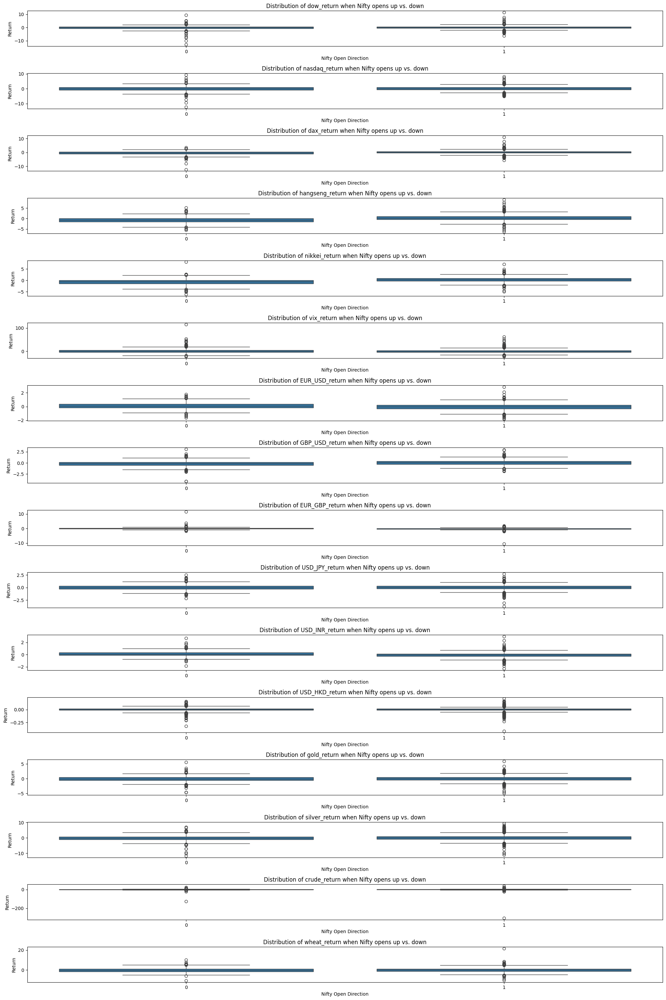

In [ ]:
#%% Part-4-c)-1 Visualize/summarize global indices including VIX for 2 categories of Nifty_Open_Dir

# Global indices columns
indices_columns = ['dow_return', 'nasdaq_return', 'dax_return', 'hangseng_return', 'nikkei_return', 'vix_return','EUR_USD_return','GBP_USD_return','EUR_GBP_return','USD_JPY_return','USD_INR_return','USD_HKD_return','gold_return','silver_return','crude_return','wheat_return']

# Create a figure and axes
fig, axes = plt.subplots(nrows=len(indices_columns), ncols=1, figsize=(20, 30))

# Plot boxplots for each index
for i, index_col in enumerate(indices_columns):
    sns.boxplot(x='Nifty_Open_Dir', y=index_col, data=masterdata, ax=axes[i])
    axes[i].set_title(f'Distribution of {index_col} when Nifty opens up vs. down')
    axes[i].set_xlabel('Nifty Open Direction')
    axes[i].set_ylabel('Return')

plt.tight_layout()
plt.show()


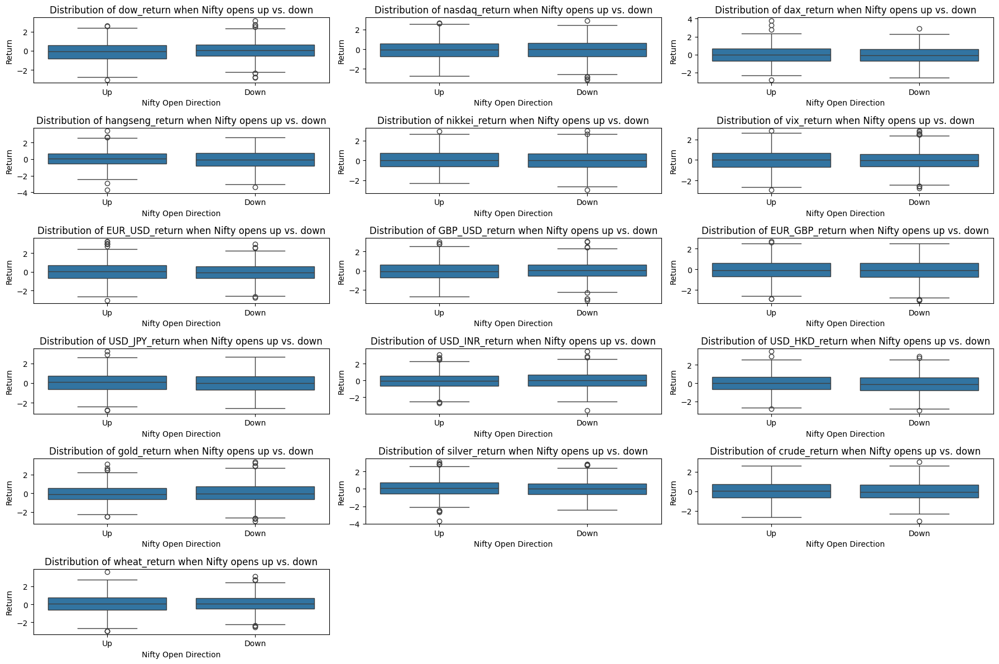

In [ ]:
#Creating smaller boxplots for PPP

#%% Part-4-c)-1 Visualize/summarize global indices including VIX for 2 categories of Nifty_Open_Dir

# Global indices columns
indices_columns = ['dow_return', 'nasdaq_return', 'dax_return', 'hangseng_return', 'nikkei_return', 'vix_return','EUR_USD_return','GBP_USD_return','EUR_GBP_return','USD_JPY_return','USD_INR_return','USD_HKD_return','gold_return','silver_return','crude_return','wheat_return']

n_indices = len(indices_columns)
# Determine the number of rows and columns for the subplot grid
n_cols = 3
n_rows = (n_indices + n_cols - 1) // n_cols  # Calculate rows needed
# Create a figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), constrained_layout=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()


# Plot boxplots for each index
for i, index_col in enumerate(indices_columns):
    sns.boxplot(x='Nifty_Open_Dir', y=index_col, data=masterdata, ax=axes[i])
    axes[i].set_title(f'Distribution of {index_col} when Nifty opens up vs. down')
    axes[i].set_xlabel('Nifty Open Direction')
    axes[i].set_ylabel('Return')
# Remove empty subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

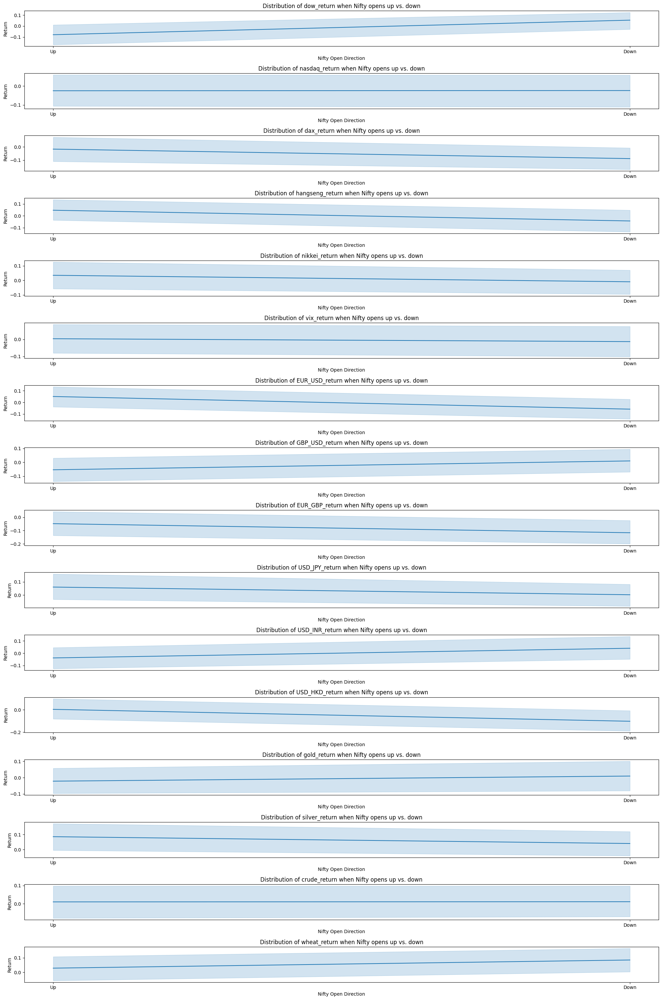

In [ ]:
#%% Part-4-c)-1 Visualize/summarize global indices including VIX for 2 categories of Nifty_Open_Dir

# Global indices columns
indices_columns = ['dow_return', 'nasdaq_return', 'dax_return', 'hangseng_return', 'nikkei_return', 'vix_return','EUR_USD_return','GBP_USD_return','EUR_GBP_return','USD_JPY_return','USD_INR_return','USD_HKD_return','gold_return','silver_return','crude_return','wheat_return']

# Create a figure and axes
fig, axes = plt.subplots(nrows=len(indices_columns), ncols=1, figsize=(20, 30))

# Plot boxplots for each index
for i, index_col in enumerate(indices_columns):
    sns.lineplot(x='Nifty_Open_Dir', y=index_col, data=masterdata, ax=axes[i])
    axes[i].set_title(f'Distribution of {index_col} when Nifty opens up vs. down')
    axes[i].set_xlabel('Nifty Open Direction')
    axes[i].set_ylabel('Return')

plt.tight_layout()
plt.show()

In [ ]:


# Define the subplot grid (adjust as needed)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (n_indices + n_cols - 1) // n_cols  # Calculate rows needed

# Create a figure with a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), constrained_layout=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()



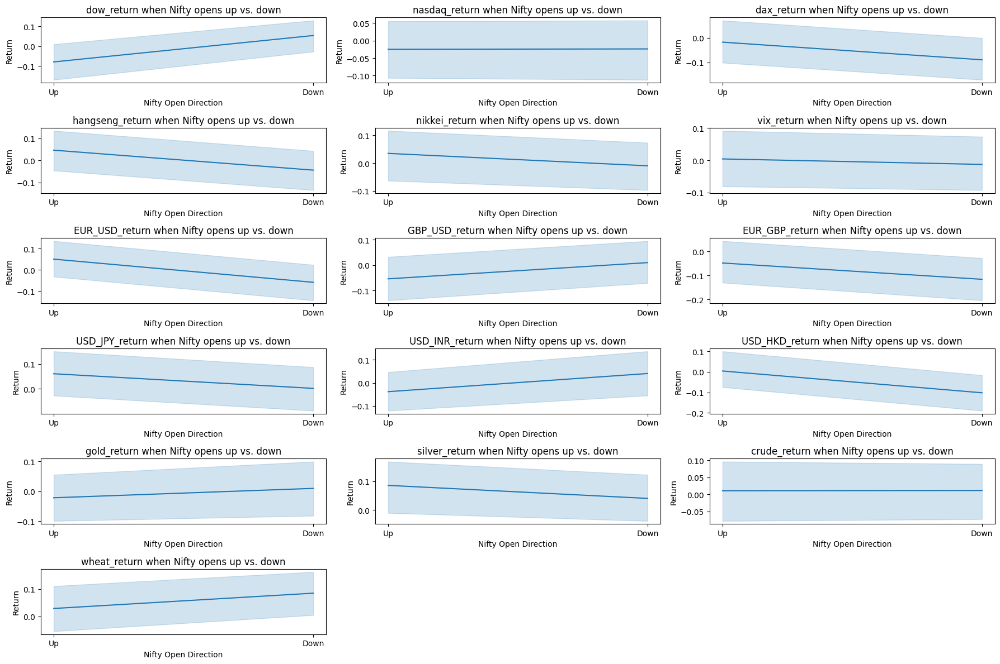

In [ ]:
#%% Part-4-c)-1 Visualize/summarize global indices including VIX for 2 categories of Nifty_Open_Dir

# Global indices columns
indices_columns = ['dow_return', 'nasdaq_return', 'dax_return', 'hangseng_return', 'nikkei_return', 'vix_return','EUR_USD_return','GBP_USD_return','EUR_GBP_return','USD_JPY_return','USD_INR_return','USD_HKD_return','gold_return','silver_return','crude_return','wheat_return']

n_indices = len(indices_columns)
# Determine the number of rows and columns for the subplot grid
n_cols = 3
n_rows = (n_indices + n_cols - 1) // n_cols  # Calculate rows needed
# Create a figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), constrained_layout=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot boxplots for each index
for i, index_col in enumerate(indices_columns):
    sns.lineplot(x='Nifty_Open_Dir', y=index_col, data=masterdata, ax=axes[i])
    axes[i].set_title(f'{index_col} when Nifty opens up vs. down')
    axes[i].set_xlabel('Nifty Open Direction')
    axes[i].set_ylabel('Return')
# Remove empty subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
